In [1]:
# IMPORTS, FILE LOADS, DETECTRON, RENDERER PREP ETC.
# IF EVER REINSTALLING MMDET AND SHIT USE OLDER VERSION OF MMDET (2.28.2), PERHAPS OLDER MMENGINE, INSTALL MMCV-FULL AND CHANGE THE MMCV MIN MAX VERSION REQUIREMENTS IN THE EACH LIBRARY'S INIT.PY FILES
from pathlib import Path
import torch
import argparse
import os
from hamer.configs import CACHE_DIR_HAMER
from hamer.models import HAMER, download_models, load_hamer, DEFAULT_CHECKPOINT
from hamer.utils import recursive_to
from hamer.datasets.vitdet_dataset import ViTDetDataset, DEFAULT_MEAN, DEFAULT_STD
from hamer.utils.renderer import Renderer, cam_crop_to_full
from vitpose_model import ViTPoseModel
from detectron2.utils.logger import setup_logger
setup_logger()
import cv2

from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

import mediapipe   as mp
import cv2 as cv
import matplotlib.pyplot as plt
import copy
import time
from mano.utils import Mesh, Struct, colors, to_np, to_tensor
import pickle
import os.path as osp
import trimesh
from mano import lbs
from mano.joints_info import TIP_IDS
import tqdm
from PIL import Image
from lang_sam import LangSAM
# local imports
from util_functions import *
from global_vars import *

args = argparse.Namespace()
args.checkpoint = DEFAULT_CHECKPOINT
args.batch_size = 1
args.rescale_factor = 2.0
args.body_detector = 'vitdet'
task_folder = "../assets/epic_kitchens"
hands_rgb = np.load(f"{task_folder}/rgb.npy")[START:END]
hands_depth = np.load(f"{task_folder}/depth.npy")[START:END]

# IM_WIDTH = hands_rgb[0].shape[1]
# IM_HEIGHT = hands_rgb[0].shape[0]

# if VIZ_DEMO:
#     # show rgbs as video
#     for i in range(hands_rgb.shape[0]):
#         im = cv2.cvtColor(hands_rgb[i], cv2.COLOR_BGR2RGB)
#         # im = cv2.cvtColor(hands_depth[i],cv2.COLOR_GRAY2BGR)
#         cv2.imshow("rgb", im)
#         cv2.waitKey(1)
#         time.sleep(0.01)
#     cv2.destroyAllWindows()


# Download and load checkpoints
download_models(CACHE_DIR_HAMER)
model, model_cfg = load_hamer(args.checkpoint)
# Setup HaMeR model
device = torch.device('cpu')
model = model.to(device)
model.eval()
# Load detector
from hamer.utils.utils_detectron2 import DefaultPredictor_Lazy
if args.body_detector == 'vitdet':
    from detectron2.config import LazyConfig
    import hamer
    cfg_path = Path(hamer.__file__).parent/'configs'/'cascade_mask_rcnn_vitdet_h_75ep.py'
    detectron2_cfg = LazyConfig.load(str(cfg_path))
    detectron2_cfg.train.init_checkpoint = "https://dl.fbaipublicfiles.com/detectron2/ViTDet/COCO/cascade_mask_rcnn_vitdet_h/f328730692/model_final_f05665.pkl"
    # detectron2_cfg.train.init_checkpoint = "https://dl.fbaipublicfiles.com/detectron2/ImageNetPretrained/MSRA/R-50.pkl"

    for i in range(3):
        detectron2_cfg.model.roi_heads.box_predictors[i].test_score_thresh = 0.01
    # detector = DefaultPredictor_Lazy(detectron2_cfg)
elif args.body_detector == 'regnety':
    
    from detectron2 import model_zoo
    from detectron2.config import get_cfg
    detectron2_cfg = model_zoo.get_config('new_baselines/mask_rcnn_regnety_4gf_dds_FPN_400ep_LSJ.py', trained=True)
    detectron2_cfg.model.roi_heads.box_predictor.test_score_thresh = 0.2
    detectron2_cfg.model.roi_heads.box_predictor.test_nms_thresh   = 0.2
    # detector       = DefaultPredictor_Lazy(detectron2_cfg)
    # keypoint detector

# detector = detector.to(device)
cpm = ViTPoseModel(device)
langsammodel = LangSAM()
# Setup the renderer
renderer = Renderer(model_cfg, faces=model.mano.faces)

print("Existing focal length: ", model_cfg.EXTRA.FOCAL_LENGTH)


/home/george/Desktop/Projects/obi-wan/python310venv/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


apex is not installed
apex is not installed
apex is not installed


2024-10-11 15:41:32.020141: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-11 15:41:32.030636: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-11 15:41:32.033850: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-11 15:41:32.043039: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-11 15:41:32.679494: W tensorflow/compiler/tf2

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


load checkpoint from local path: /home/george/Desktop/Projects/obi-wan/hamer//_DATA/vitpose_ckpts/vitpose+_huge/wholebody.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: backbone.blocks.0.mlp.experts.0.weight, backbone.blocks.0.mlp.experts.0.bias, backbone.blocks.0.mlp.experts.1.weight, backbone.blocks.0.mlp.experts.1.bias, backbone.blocks.0.mlp.experts.2.weight, backbone.blocks.0.mlp.experts.2.bias, backbone.blocks.0.mlp.experts.3.weight, backbone.blocks.0.mlp.experts.3.bias, backbone.blocks.0.mlp.experts.4.weight, backbone.blocks.0.mlp.experts.4.bias, backbone.blocks.0.mlp.experts.5.weight, backbone.blocks.0.mlp.experts.5.bias, backbone.blocks.1.mlp.experts.0.weight, backbone.blocks.1.mlp.experts.0.bias, backbone.blocks.1.mlp.experts.1.weight, backbone.blocks.1.mlp.experts.1.bias, backbone.blocks.1.mlp.experts.2.weight, backbone.blocks.1.mlp.experts.2.bias, backbone.blocks.1.mlp.experts.3.weight, backbone.blocks.1.mlp.experts.3.bias, bac

final text_encoder_type: bert-base-uncased
Model loaded from /home/george/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])
Existing focal length:  5000


In [24]:
from mmdet.apis import inference_detector, init_detector
from mmpose.apis import (
    inference_top_down_pose_model,
    init_pose_model,
    process_mmdet_results,
    vis_pose_result,
)
import numpy as np
import torch
from torch import nn

class DetModel:
    MODEL_DICT = {
        "YOLOX-tiny": {
            "config": "mmdet_configs/configs/yolox/yolox_tiny_8x8_300e_coco.py",
            "model": "https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_tiny_8x8_300e_coco/yolox_tiny_8x8_300e_coco_20211124_171234-b4047906.pth",
        },
        "YOLOX-s": {
            "config": "mmdet_configs/configs/yolox/yolox_s_8x8_300e_coco.py",
            "model": "https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth",
        },
        "YOLOX-l": {
            "config": "mmdet_configs/configs/yolox/yolox_l_8x8_300e_coco.py",
            "model": "https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_l_8x8_300e_coco/yolox_l_8x8_300e_coco_20211126_140236-d3bd2b23.pth",
        },
        "YOLOX-x": {
            "config": "mmdet_configs/configs/yolox/yolox_x_8x8_300e_coco.py",
            "model": "https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_x_8x8_300e_coco/yolox_x_8x8_300e_coco_20211126_140254-1ef88d67.pth",
        },

        "Swin-T": {
            "config": "mmdet_configs/configs/swin/mask_rcnn_swin-s-p4-w7_fpn_fp16_ms-crop-3x_coco.py",
            "model": "https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_small_patch4_window7_224.pth",
        },
                "Swin-T2": {
            "config": "mmdet_configs/configs/swin/mask_rcnn_swin-t-p4-w7_fpn_1x_coco.py",
            "model": "https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_tiny_patch4_window7_224.pth",
        },

                        "Swin-T3": {
            "config": "mmdet_configs/configs/swin/mask_rcnn_swin-t-p4-w7_fpn_ms-crop-3x_coco.py",
            "model": "https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_tiny_patch4_window7_224.pth",
        },
    }

    def __init__(self):
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self._load_all_models_once()
        self.model_name = "YOLOX-x"
        self.model = self._load_model(self.model_name)

    def _load_all_models_once(self) -> None:
        for name in self.MODEL_DICT:
            self._load_model(name)

    def _load_model(self, name: str) -> nn.Module:
        d = self.MODEL_DICT[name]
        return init_detector(d["config"], d["model"], device=self.device)

    def set_model(self, name: str) -> None:
        if name == self.model_name:
            return
        self.model_name = name
        self.model = self._load_model(name)

    def detect_and_visualize(self, image: np.ndarray, score_threshold: float) -> tuple[list[np.ndarray], np.ndarray]:
        out = self.detect(image)
        vis = self.visualize_detection_results(image, out, score_threshold)
        return out, vis

    def detect(self, image: np.ndarray) -> list[np.ndarray]:
        image = image[:, :, ::-1]  # RGB -> BGR
        out = inference_detector(self.model, image)
        return out

    def visualize_detection_results(
        self, image: np.ndarray, detection_results: list[np.ndarray], score_threshold: float = 0.3
    ) -> np.ndarray:
        person_det = [detection_results[0]] + [np.array([]).reshape(0, 5)] * 79

        image = image[:, :, ::-1]  # RGB -> BGR
        vis = self.model.show_result(
            image, person_det, score_thr=score_threshold, bbox_color=None, text_color=(200, 200, 200), mask_color=None
        )
        return vis[:, :, ::-1]  # BGR -> RGB
    
mmdetectmodel = DetModel()





load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_tiny_8x8_300e_coco/yolox_tiny_8x8_300e_coco_20211124_171234-b4047906.pth
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_s_8x8_300e_coco/yolox_s_8x8_300e_coco_20211121_095711-4592a793.pth
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_l_8x8_300e_coco/yolox_l_8x8_300e_coco_20211126_140236-d3bd2b23.pth
load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_x_8x8_300e_coco/yolox_x_8x8_300e_coco_20211126_140254-1ef88d67.pth
load checkpoint from http path: https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_small_patch4_window7_224.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: model

missing keys in source state_dict: backbone.patch_embed.projection.weight, backbone.patch_embed.projection.bias, backbone.patc

load checkpoint from http path: https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_tiny_patch4_window7_224.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: model

missing keys in source state_dict: backbone.patch_embed.projection.weight, backbone.patch_embed.projection.bias, backbone.patch_embed.norm.weight, backbone.patch_embed.norm.bias, backbone.stages.0.blocks.0.norm1.weight, backbone.stages.0.blocks.0.norm1.bias, backbone.stages.0.blocks.0.attn.w_msa.relative_position_bias_table, backbone.stages.0.blocks.0.attn.w_msa.relative_position_index, backbone.stages.0.blocks.0.attn.w_msa.qkv.weight, backbone.stages.0.blocks.0.attn.w_msa.qkv.bias, backbone.stages.0.blocks.0.attn.w_msa.proj.weight, backbone.stages.0.blocks.0.attn.w_msa.proj.bias, backbone.stages.0.blocks.0.norm2.weight, backbone.stages.0.blocks.0.norm2.bias, backbone.stages.0.blocks.0.ffn.layers.0.0.weight, backbone.stages.0.blocks.0.ffn.layers.0.0.bias, bac

load checkpoint from http path: https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_tiny_patch4_window7_224.pth
The model and loaded state dict do not match exactly

unexpected key in source state_dict: model

missing keys in source state_dict: backbone.patch_embed.projection.weight, backbone.patch_embed.projection.bias, backbone.patch_embed.norm.weight, backbone.patch_embed.norm.bias, backbone.stages.0.blocks.0.norm1.weight, backbone.stages.0.blocks.0.norm1.bias, backbone.stages.0.blocks.0.attn.w_msa.relative_position_bias_table, backbone.stages.0.blocks.0.attn.w_msa.relative_position_index, backbone.stages.0.blocks.0.attn.w_msa.qkv.weight, backbone.stages.0.blocks.0.attn.w_msa.qkv.bias, backbone.stages.0.blocks.0.attn.w_msa.proj.weight, backbone.stages.0.blocks.0.attn.w_msa.proj.bias, backbone.stages.0.blocks.0.norm2.weight, backbone.stages.0.blocks.0.norm2.bias, backbone.stages.0.blocks.0.ffn.layers.0.0.weight, backbone.stages.0.blocks.0.ffn.layers.0.0.bias, bac

load checkpoint from http path: https://download.openmmlab.com/mmdetection/v2.0/yolox/yolox_x_8x8_300e_coco/yolox_x_8x8_300e_coco_20211126_140254-1ef88d67.pth


In [25]:
def get_hand_and_rendered_depth(rgb):
    # Get all demo images ends with .jpg or .png
    # Iterate over all images in folder
    start_time = time.time()
    # img_cv2 = rgb
    # img_cv2 = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
    # Detect humans in image
    img_cv2 = (rgb * 255).astype(np.uint8)
    det_out, viz = mmdetectmodel.detect_and_visualize(img_cv2, score_threshold=0.5)
    plt.imshow(viz)
    plt.show()
    person_instance = det_out[0]
    #extract person bounding box and score
    pred_bboxes = person_instance[:, :4]
    pred_scores = person_instance[:, 4]
    img = copy.deepcopy(img_cv2)
    # img = img_cv2.copy()[:, :, ::-1]
    # det_instances = det_out['instances']
    # valid_idx = (det_instances.pred_classes==0) & (det_instances.scores > 0.1)
    # pred_bboxes=det_instances.pred_boxes.tensor[valid_idx].cpu().numpy()
    # pred_scores=det_instances.scores[valid_idx].cpu().numpy()
    # Detect human keypoints for each person
    # vit_poseout1 = cpm.detect(img)
    # print(vit_poseout1)
    vitposes_out = cpm.predict_pose(img, [np.concatenate([pred_bboxes, pred_scores[:, None]], axis=1)],)
    bboxes = []
    is_right = []
    # Use hands based on hand keypoint detections
    for vitposes in vitposes_out:
        left_hand_keyp = vitposes['keypoints'][-42:-21]
        right_hand_keyp = vitposes['keypoints'][-21:]
        # Rejecting not confident detections
        keyp = left_hand_keyp
        valid = keyp[:,2] > 0.5
        if sum(valid) > 3:
            bbox = [keyp[valid,0].min(), keyp[valid,1].min(), keyp[valid,0].max(), keyp[valid,1].max()]
            bboxes.append(bbox)
            is_right.append(0)
        keyp = right_hand_keyp
        valid = keyp[:,2] > 0.5
        if sum(valid) > 3:
            bbox = [keyp[valid,0].min(), keyp[valid,1].min(), keyp[valid,0].max(), keyp[valid,1].max()]
            bboxes.append(bbox)
            is_right.append(1)
    print("Time taken to detect hands: ", time.time() - start_time)
    boxes = np.stack(bboxes)
    right = np.stack(is_right)
    # boxes = np.array(bboxes)
    # right = np.array(is_right)
    # print("Boxes: ", boxes)
    # print("Right: ", right)
    # Run reconstruction on all detected hands
    dataset = ViTDetDataset(model_cfg, img_cv2, boxes, right, rescale_factor=args.rescale_factor)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=8, shuffle=False, num_workers=0)
    all_verts = []
    all_cam_t = []
    all_right = []
    
    for batch in dataloader:
        batch = recursive_to(batch, device)
        with torch.no_grad():
            out = model(batch)
        multiplier = (2*batch['right']-1)
        pred_cam = out['pred_cam']
        pred_cam[:,1] = multiplier*pred_cam[:,1]
        box_center = batch["box_center"].float()
        box_size = batch["box_size"].float()
        img_size = batch["img_size"].float()
        multiplier = (2*batch['right']-1)
        scaled_focal_length = model_cfg.EXTRA.FOCAL_LENGTH / model_cfg.MODEL.IMAGE_SIZE * img_size.max()
        pred_cam_t_full = cam_crop_to_full(pred_cam, box_center, box_size, img_size, scaled_focal_length).detach().cpu().numpy()
        # Render the result
        batch_size = batch['img'].shape[0]
        print(f'Batch size: {batch_size}')
        for n in range(batch_size):
            # Get filename from path img_path
            input_patch = batch['img'][n].cpu() * (DEFAULT_STD[:,None,None]/255) + (DEFAULT_MEAN[:,None,None]/255)
            input_patch = input_patch.permute(1,2,0).numpy()
            # Add all verts and cams to list
            verts = out['pred_vertices'][n].detach().cpu().numpy()
            is_right = batch['right'][n].cpu().numpy()
            verts[:,0] = (2*is_right-1)*verts[:,0]
            cam_t = pred_cam_t_full[n]
            all_verts.append(verts)
            all_cam_t.append(cam_t)
            all_right.append(is_right)
    all_verts_as_np = np.asarray(all_verts)
    all_verts_as_np = all_verts_as_np[0]
    all_verts_list = [all_verts_as_np]

    misc_args = dict(
        mesh_base_color=HUMAN_HAND_COLOR,
        scene_bg_color=(1, 1, 1),
        focal_length=scaled_focal_length,
    )
    cam_view, rend_depth_front_view, mesh_list = renderer.render_rgba_multiple(all_verts_list, cam_t=all_cam_t, render_res=img_size[n], is_right=all_right, **misc_args)
    # Overlay image
    input_img = img_cv2.astype(np.float32)[:,:,::-1]/255.0
    input_img = np.concatenate([input_img, np.ones_like(input_img[:,:,:1])], axis=2) # Add alpha channel
    input_img_overlay = input_img[:,:,:3] * (1-cam_view[:,:,3:]) + cam_view[:,:,:3] * cam_view[:,:,3:]
    camera_translation = cam_t.copy()
    hand_mesh = renderer.vertices_to_trimesh(verts, camera_translation, HUMAN_HAND_COLOR, is_right=is_right)
    return input_img_overlay, cam_view, rend_depth_front_view, det_out, out, (hand_mesh, camera_translation, verts), (mesh_list, all_cam_t, all_verts)

def get_hand_and_rendered_depth_batched(rgb):
    # Get all demo images ends with .jpg or .png
    # Iterate over all images in folder
    img_cv2 = rgb
    img_cv2 = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
    # Detect humans in image
    det_out = detector(img_cv2)
    img = img_cv2.copy()[:, :, ::-1]
    det_instances = det_out['instances']
    valid_idx = (det_instances.pred_classes==0) & (det_instances.scores > 0.5)
    pred_bboxes=det_instances.pred_boxes.tensor[valid_idx].cpu().numpy()
    pred_scores=det_instances.scores[valid_idx].cpu().numpy()
    # Detect human keypoints for each person
    vitposes_out = cpm.predict_pose(img, [np.concatenate([pred_bboxes, pred_scores[:, None]], axis=1)],)
    bboxes = []
    is_right = []
    # Use hands based on hand keypoint detections
    for vitposes in vitposes_out:
        left_hand_keyp = vitposes['keypoints'][-42:-21]
        right_hand_keyp = vitposes['keypoints'][-21:]
        # Rejecting not confident detections
        keyp = left_hand_keyp
        valid = keyp[:,2] > 0.5
        if sum(valid) > 3:
            bbox = [keyp[valid,0].min(), keyp[valid,1].min(), keyp[valid,0].max(), keyp[valid,1].max()]
            bboxes.append(bbox)
            is_right.append(0)
        keyp = right_hand_keyp
        valid = keyp[:,2] > 0.5
        if sum(valid) > 3:
            bbox = [keyp[valid,0].min(), keyp[valid,1].min(), keyp[valid,0].max(), keyp[valid,1].max()]
            bboxes.append(bbox)
            is_right.append(1)

    boxes = np.stack(bboxes)
    right = np.stack(is_right)
    # Run reconstruction on all detected hands
    dataset = ViTDetDataset(model_cfg, img_cv2, boxes, right, rescale_factor=args.rescale_factor)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=8, shuffle=False, num_workers=0)
    all_verts = []
    all_cam_t = []
    all_right = []
    
    for batch in dataloader:
        batch = recursive_to(batch, device)
        with torch.no_grad():
            out = model(batch)
        multiplier = (2*batch['right']-1)
        pred_cam = out['pred_cam']
        pred_cam[:,1] = multiplier*pred_cam[:,1]
        box_center = batch["box_center"].float()
        box_size = batch["box_size"].float()
        img_size = batch["img_size"].float()
        multiplier = (2*batch['right']-1)
        scaled_focal_length = model_cfg.EXTRA.FOCAL_LENGTH / model_cfg.MODEL.IMAGE_SIZE * img_size.max()
        pred_cam_t_full = cam_crop_to_full(pred_cam, box_center, box_size, img_size, scaled_focal_length).detach().cpu().numpy()
        # Render the result
        batch_size = batch['img'].shape[0]
        print(f'Batch size: {batch_size}')
        for n in range(batch_size):
            # Get filename from path img_path
            input_patch = batch['img'][n].cpu() * (DEFAULT_STD[:,None,None]/255) + (DEFAULT_MEAN[:,None,None]/255)
            input_patch = input_patch.permute(1,2,0).numpy()
            # Add all verts and cams to list
            verts = out['pred_vertices'][n].detach().cpu().numpy()
            is_right = batch['right'][n].cpu().numpy()
            verts[:,0] = (2*is_right-1)*verts[:,0]
            cam_t = pred_cam_t_full[n]
            all_verts.append(verts)
            all_cam_t.append(cam_t)
            all_right.append(is_right)
    all_verts_as_np = np.asarray(all_verts)
    all_verts_as_np = all_verts_as_np[0]
    all_verts_list = [all_verts_as_np]

    misc_args = dict(
        mesh_base_color=HUMAN_HAND_COLOR,
        scene_bg_color=(1, 1, 1),
        focal_length=scaled_focal_length,
    )
    cam_view, rend_depth_front_view, mesh_list = renderer.render_rgba_multiple(all_verts_list, cam_t=all_cam_t, render_res=img_size[n], is_right=all_right, **misc_args)
    # Overlay image
    input_img = img_cv2.astype(np.float32)[:,:,::-1]/255.0
    input_img = np.concatenate([input_img, np.ones_like(input_img[:,:,:1])], axis=2) # Add alpha channel
    input_img_overlay = input_img[:,:,:3] * (1-cam_view[:,:,3:]) + cam_view[:,:,:3] * cam_view[:,:,3:]
    camera_translation = cam_t.copy()
    hand_mesh = renderer.vertices_to_trimesh(verts, camera_translation, HUMAN_HAND_COLOR, is_right=is_right)
    return input_img_overlay, cam_view, rend_depth_front_view, det_out, out, (hand_mesh, camera_translation, verts), (mesh_list, all_cam_t, all_verts)


def get_hand_mask_from_detectron(det_out, show_mask=False, rgb_im=None):
    if show_mask and rgb_im is not None:
        # Create config. THESE ARE ONLY USED FOR THE VIZUALIZER
        cfg = get_cfg()
        cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
        cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
        # Make prediction
        outputs = det_out
        v = Visualizer(rgb_im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
        v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    # # Extract person mask
    # # print(np.argwhere(outputs['instances'].pred_classes == 0)[0, 0])
    # human_mask = outputs["instances"].pred_masks[np.argwhere(outputs['instances'].pred_classes == 0)[0,0].item()].cpu().numpy()
    # Extract person mask
    try:
        human_mask = det_out["instances"].pred_masks[np.argwhere(det_out['instances'].pred_classes == 0)[0,0].item()].cpu().numpy()
    except:
        human_mask = det_out["instances"].pred_masks[np.argwhere(det_out['instances'].pred_classes.cpu().numpy() == 0)[0,0].item()].cpu().numpy()

    return human_mask


def get_hand_keypoints_from_mediapipe(rgb_im, viz_keypoints=False):
    # # Initialize MediaPipe Hands.
    mp_hands = mp.solutions.hands
    hands = mp_hands.Hands(static_image_mode=True, max_num_hands=2, min_detection_confidence=0.5)
    color_image = copy.deepcopy((rgb_im * 255.0).astype(np.uint8))
    if viz_keypoints:
        plt.imshow(rgb_im)
        plt.axis('off')
        plt.show()
    # Process the image to find hand landmarks.
    results = hands.process(color_image)
    d_val = -1
    # Draw the hand landmarks on the image.
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            for landmark in hand_landmarks.landmark:
                # Draw a circle on the image.
                cx, cy = int(landmark.x * color_image.shape[1]), int(landmark.y * color_image.shape[0])
                cv.circle(color_image, (cx, cy), 5, (0, 255, 0), -1)
    mp_drawing = mp.solutions.drawing_utils
    image = color_image
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            mp_drawing.draw_landmarks(image, hand_landmarks, mp_hands.HAND_CONNECTIONS)
            # Example: Get the tip of the index finger
            index_tip = hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP]
            # print(f"Index Finger Tip Coordinates: (x: {index_tip.x}, y: {index_tip.y}, z: {index_tip.z})")
            index_x, index_y = int(index_tip.x * image.shape[1]), int(index_tip.y * image.shape[0])
            thumb_tip = hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_TIP]
            # print(f"Thumb Tip Coordinates: (x: {thumb_tip.x}, y: {thumb_tip.y}, z: {thumb_tip.z})")
            thumb_x, thumb_y = int(thumb_tip.x * image.shape[1]), int(thumb_tip.y * image.shape[0])
            middle_tip = hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_TIP]
            # print(f"Middle Finger Tip Coordinates: (x: {middle_tip.x}, y: {middle_tip.y}, z: {middle_tip.z})")
            middle_x, middle_y = int(middle_tip.x * image.shape[1]), int(middle_tip.y * image.shape[0])
    # Extract a hand mesh from the hand landmarks and display it.
    hand_mesh = mp_hands.HAND_CONNECTIONS
    hand_mesh = [list(pair) for pair in hand_mesh]
    # Draw the hand mesh on the image.
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            for connection in hand_mesh:
                # Get the coordinates of the two points.
                start = (int(hand_landmarks.landmark[connection[0]].x * image.shape[1]),
                        int(hand_landmarks.landmark[connection[0]].y * image.shape[0]))
                end = (int(hand_landmarks.landmark[connection[1]].x * image.shape[1]),
                    int(hand_landmarks.landmark[connection[1]].y * image.shape[0]))
                # Draw a line connecting the two points.
                cv.line(image, start, end, (0, 255, 0), 2)
    # Matplotlib visualization
    # plt.imshow(image)
    # plt.axis('off')
    # plt.show()
        
    # Draw a cirlce on the pixel of the index finger tip using matplotlib.
    thumb_cmc = hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_CMC]
    thumb_cmc_x, thumb_cmc_y = int(thumb_cmc.x * image.shape[1]), int(thumb_cmc.y * image.shape[0])

    thumb_IP = hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_IP]
    thumb_IP_x, thumb_IP_y = int(thumb_IP.x * image.shape[1]), int(thumb_IP.y * image.shape[0])

    thumb_MCP = hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_MCP]
    thumb_MCP_x, thumb_MCP_y = int(thumb_MCP.x * image.shape[1]), int(thumb_MCP.y * image.shape[0])

    index_mc = hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_MCP]
    index_mc_x, index_mc_y = int(index_mc.x * image.shape[1]), int(index_mc.y * image.shape[0])

    index_pip = hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_PIP]
    index_pip_x, index_pip_y = int(index_pip.x * image.shape[1]), int(index_pip.y * image.shape[0])

    index_dip = hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_DIP]
    index_dip_x, index_dip_y = int(index_dip.x * image.shape[1]), int(index_dip.y * image.shape[0])
    
    if viz_keypoints:
        plt.imshow(rgb_im)
        plt.scatter(index_x, index_y, color='blue', s=10)
        plt.scatter(index_dip_x, index_dip_y, color='orange', s=10)

        plt.scatter(index_pip_x, index_pip_y, color='purple', s=10)
        plt.scatter(thumb_x, thumb_y, color='blue', s=10)
        plt.scatter(thumb_IP_x, thumb_IP_y, color='orange', s=10)
        plt.scatter(thumb_MCP_x, thumb_MCP_y, color='purple', s=10)

    index_finger_1_x, index_finger_1_y = index_x, index_y
    index_finger_2_x, index_finger_2_y = index_dip_x, index_dip_y
    index_finger_3_x, index_finger_3_y = index_pip_x, index_pip_y

    thumb_1_x, thumb_1_y = thumb_x, thumb_y
    thumb_2_x, thumb_2_y = thumb_IP_x, thumb_IP_y
    thumb_3_x, thumb_3_y = thumb_MCP_x, thumb_MCP_y
    return middle_x, middle_y, index_finger_1_x, index_finger_1_y, index_finger_2_x, index_finger_2_y, index_finger_3_x, index_finger_3_y, thumb_1_x, thumb_1_y, thumb_2_x, thumb_2_y, thumb_3_x, thumb_3_y

def get_hand_pcd_in_scene_from_rendered_model(rgb_im, depth_im, rend_depth_front_view, new_depth_image, human_mask, vizualize=False):

    # point_cloud_ori = depth_to_point_cloud(rend_depth_front_view, INTRINSICS_HAMER_RENDERER[0, 0], INTRINSICS_HAMER_RENDERER[1, 1],  INTRINSICS_HAMER_RENDERER[0, 2],  INTRINSICS_HAMER_RENDERER[1, 2]) # Hamer intrinsics, depth at renderer's scale (does not match real)
    # point_cloud_ori = point_cloud_ori.reshape(-1, 3)
    # point_cloud_ori = point_cloud_ori[point_cloud_ori[:, 2] > 0]
    point_cloud_camera = depth_to_point_cloud(depth_im, INTRINSICS_REAL_CAMERA[0, 0], INTRINSICS_REAL_CAMERA[1, 1], INTRINSICS_REAL_CAMERA[0, 2], INTRINSICS_REAL_CAMERA[1, 2]) # Camera intrinsics, depth at real scale, although the shape is not accurate
    point_cloud_camera = point_cloud_camera.reshape(-1, 3)
    # point_cloud_kinect = point_cloud_kinect[point_cloud_kinect[:, 2] > 400]
    point_cloud_rescaled_depth = depth_to_point_cloud(new_depth_image, INTRINSICS_HAMER_RENDERER[0, 0], INTRINSICS_HAMER_RENDERER[1, 1], INTRINSICS_HAMER_RENDERER[0, 2],  INTRINSICS_HAMER_RENDERER[1, 2]) # Hamer intrinsics, depth at real scale, shape does not match real
    point_cloud_rescaled_depth = point_cloud_rescaled_depth.reshape(-1, 3)
    # point_cloud_rescaled_depth = point_cloud_rescaled_depth[point_cloud_rescaled_depth[:, 2] > 400]
    # Show the point cloud in open3d
    # pcd_hand_to_scale = o3d.geometry.PointCloud()
    # pcd_hand_to_scale.points = o3d.utility.Vector3dVector(point_cloud_ori)
    pcd_camera = o3d.geometry.PointCloud()
    pcd_camera.points = o3d.utility.Vector3dVector(point_cloud_camera)
    pcd_rescaled_depth = o3d.geometry.PointCloud()
    pcd_rescaled_depth.points = o3d.utility.Vector3dVector(point_cloud_rescaled_depth)

    show_scaled_up_pcd = False
    remove_outliers=False # does not work that well, a big hacky
    # print("point cloud camera shape: ", point_cloud_camera.shape)
    point_cloud_camera = point_cloud_camera.reshape(IM_HEIGHT, IM_WIDTH, 3)
    point_cloud_rescaled_depth = point_cloud_rescaled_depth.reshape(IM_HEIGHT, IM_WIDTH, 3)
    # Extract common points between rendered model and live image
    common_points_binary = np.zeros_like(new_depth_image)
    common_points_binary[new_depth_image > 0] = 1 # binary mask of points in the rendered model depth

    depth_im_hand =  human_mask * depth_im # extract human hand from the live image
    depth_im_hand = common_points_binary * depth_im_hand # extract common points between rendered depth model and live image
    # depth_im_hand[depth_im_hand > .8] = 0 # remove all points 2m away from the camera
    if vizualize:
        print(depth_im_hand[depth_im_hand > .5])
        plt.imshow(depth_im_hand)
        plt.title("Depth image of hand after human mask")
        plt.show()

    if remove_outliers: # a bit hacky, does not do much, if not cause problems
        mean_depth = np.mean(new_depth_image[new_depth_image > 0])
        std_depth = np.std(new_depth_image[new_depth_image > 0])
        outlier_points = np.ones_like(depth_im_hand)
        outlier_points[depth_im_hand > mean_depth + 3*std_depth] = 0
        outlier_points[depth_im_hand < mean_depth - 3*std_depth] = 0
        plt.imshow(outlier_points)
        plt.title("Outlier points")
        plt.show()
        depth_im_hand = depth_im_hand * outlier_points
        
    common_points = np.zeros_like(depth_im_hand)
    common_points[depth_im_hand > 0] = 1 # Binary mask of common points between rendered model depth and live image
    
    if vizualize:
        plt.imshow(common_points)
        plt.title("Common points")
        plt.show()

    common_pts_indices = np.argwhere(common_points > 0) # extract common points indices
    q = point_cloud_camera[common_pts_indices[:, 0], common_pts_indices[:, 1]]
    p = point_cloud_rescaled_depth[common_pts_indices[:, 0], common_pts_indices[:, 1]]

    T = find_scaled_transformation(p, q, use_scale=False) # Compute scale and rotation matrix Tp = q
    pcd_rendered_hand_to_live_hand = apply_transformation(point_cloud_rescaled_depth.reshape(-1, 3), T)
    pcd_rendered_hand_to_live_hand = pcd_rendered_hand_to_live_hand.reshape(-1, 3)
    pcd_rendered_hand_to_live_hand_full = copy.deepcopy(pcd_rendered_hand_to_live_hand)
    # pcd_rendered_hand_to_live_hand = pcd_rendered_hand_to_live_hand[pcd_rendered_hand_to_live_hand[:, 2] > .400]

    # Show the point cloud in open3d
    pcd_hand_to_scale = o3d.geometry.PointCloud()
    pcd_hand_to_scale.points = o3d.utility.Vector3dVector(pcd_rendered_hand_to_live_hand)
    # pcd2 = o3d.geometry.PointCloud()
    pcdk = point_cloud_camera.reshape(-1, 3)
    # pcdk = pcdk[pcdk[:, 2] > .400]
    # pcd2.points = o3d.utility.Vector3dVector(pcdk)
    # pcd2.paint_uniform_color([1, 1, 0])
    if show_scaled_up_pcd:
        o3d.visualization.draw_geometries([pcd_hand_to_scale])
    hand_point_cloud = pcd_rendered_hand_to_live_hand # from above
    hand_point_cloud_full = pcd_rendered_hand_to_live_hand_full
    use_scaled_up_hand = True
    use_both_projected_hands = False
    clean_live_image_background = True
    if clean_live_image_background:
        mean_depth_hand = np.mean(new_depth_image[new_depth_image > 0])
        std_depth_hand = np.std(new_depth_image[new_depth_image > 0])
        depth_im[depth_im > mean_depth_hand + 1000] = 0
        depth_im[depth_im < mean_depth_hand - 1000] = 0
    if not use_scaled_up_hand and not use_both_projected_hands:
        hand_point_cloud = depth_to_point_cloud(new_depth_image, INTRINSICS_REAL_CAMERA[0, 0], INTRINSICS_REAL_CAMERA[1, 1], INTRINSICS_REAL_CAMERA[0, 2], INTRINSICS_REAL_CAMERA[1, 2])
        hand_point_cloud = hand_point_cloud.reshape(-1, 3)
        hand_point_cloud_full = hand_point_cloud
    if use_both_projected_hands:
        hand_point_cloud_via_intrinsics = depth_to_point_cloud(new_depth_image, INTRINSICS_REAL_CAMERA[0, 0], INTRINSICS_REAL_CAMERA[1, 1], INTRINSICS_REAL_CAMERA[0, 2], INTRINSICS_REAL_CAMERA[1, 2])
        hand_point_cloud_via_intrinsics = hand_point_cloud_via_intrinsics.reshape(-1, 3)
    image_point_cloud = depth_to_point_cloud(depth_im, INTRINSICS_REAL_CAMERA[0, 0], INTRINSICS_REAL_CAMERA[1, 1], INTRINSICS_REAL_CAMERA[0, 2], INTRINSICS_REAL_CAMERA[1, 2])
    image_point_cloud = image_point_cloud.reshape(-1, 3)
    # Point cloud to open3d point cloud
    pcd_hand_to_scale = o3d.geometry.PointCloud()
    pcd_hand_to_scale.points = o3d.utility.Vector3dVector(hand_point_cloud[hand_point_cloud[:, 2] > 0])
    # Set pcd color to red
    pcd_hand_to_scale.paint_uniform_color([1, 0, 0])
    pcd_image = o3d.geometry.PointCloud()
    pcd_image.points = o3d.utility.Vector3dVector(image_point_cloud)
    # Set color to RGB
    pcd_image.colors = o3d.utility.Vector3dVector(rgb_im.reshape(-1, 3))
    # Set pcd color to blue
    # pcd_original.paint_uniform_color([0, 0, 1])
    if use_both_projected_hands and vizualize:
        pcd_via_intrinsics = o3d.geometry.PointCloud()
        pcd_via_intrinsics.points = o3d.utility.Vector3dVector(hand_point_cloud_via_intrinsics[hand_point_cloud_via_intrinsics[:, 2] > 0])
        pcd_via_intrinsics.paint_uniform_color([0, 1, 0])
        pcd_hand_to_scale.paint_uniform_color([1, 0, 0])
        o3d.visualization.draw_geometries([pcd_hand_to_scale, pcd_image, pcd_via_intrinsics])
    elif vizualize:
        o3d.visualization.draw_geometries([pcd_hand_to_scale, pcd_image])

    return hand_point_cloud, hand_point_cloud_full, image_point_cloud, pcd_hand_to_scale, pcd_image, T

def align_gripper_to_hand(hand_point_cloud, hand_pcd_as_o3d, gripper_pcd, gripper_pcd_as_o3d, vizualize=False):

    # Compute the principal axis of the point cloud
    principal_axis_h, second_axis_h = compute_principal_axis(hand_point_cloud)
    principal_axis_g, second_axis_g = compute_principal_axis(gripper_pcd, switch_principal_axis=True)
    middle_point_gripper = np.mean(gripper_pcd, axis=0)
    middle_point_hand = np.mean(hand_point_cloud, axis=0)
    if vizualize:
        # Plot a vector in the direction of the principal axis in open3d
        line_set_h1 = o3d.geometry.LineSet()
        line_set_h1.points = o3d.utility.Vector3dVector([middle_point_hand, middle_point_hand + principal_axis_h])
        line_set_h1.lines = o3d.utility.Vector2iVector([[0, 1]])
        # make line red
        line_set_h1.colors = o3d.utility.Vector3dVector([[1, 0, 0]])
        line_set_h2 = o3d.geometry.LineSet()
        line_set_h2.points = o3d.utility.Vector3dVector([middle_point_hand, middle_point_hand - principal_axis_h])
        line_set_h2.lines = o3d.utility.Vector2iVector([[0, 1]])
        # make line red
        line_set_h2.colors = o3d.utility.Vector3dVector([[1, 0, 0]])
        line_set_h3 = o3d.geometry.LineSet()
        line_set_h3.points = o3d.utility.Vector3dVector([middle_point_hand, middle_point_hand + second_axis_h])
        line_set_h3.lines = o3d.utility.Vector2iVector([[0, 1]])
        # make line green
        line_set_h3.colors = o3d.utility.Vector3dVector([[0, 1, 0]])
        line_set_h4 = o3d.geometry.LineSet()
        line_set_h4.points = o3d.utility.Vector3dVector([middle_point_hand, middle_point_hand - second_axis_h])
        line_set_h4.lines = o3d.utility.Vector2iVector([[0, 1]])
        # make line green
        line_set_h4.colors = o3d.utility.Vector3dVector([[0, 1, 0]])
        line_set_g1 = o3d.geometry.LineSet()
        line_set_g1.points = o3d.utility.Vector3dVector([middle_point_gripper, middle_point_gripper + principal_axis_g])
        line_set_g1.lines = o3d.utility.Vector2iVector([[0, 1]])
        # make line red
        line_set_g1.colors = o3d.utility.Vector3dVector([[1, 0, 0]])
        line_set_g2 = o3d.geometry.LineSet()
        line_set_g2.points = o3d.utility.Vector3dVector([middle_point_gripper, middle_point_gripper - principal_axis_g])
        line_set_g2.lines = o3d.utility.Vector2iVector([[0, 1]])
        # make line red
        line_set_g2.colors = o3d.utility.Vector3dVector([[1, 0, 0]])
        line_set_g3 = o3d.geometry.LineSet()
        line_set_g3.points = o3d.utility.Vector3dVector([middle_point_gripper, middle_point_gripper + second_axis_g])
        line_set_g3.lines = o3d.utility.Vector2iVector([[0, 1]])
        # make line green
        line_set_g3.colors = o3d.utility.Vector3dVector([[0, 1, 0]])
        line_set_g4 = o3d.geometry.LineSet()
        line_set_g4.points = o3d.utility.Vector3dVector([middle_point_gripper, middle_point_gripper - second_axis_g])
        line_set_g4.lines = o3d.utility.Vector2iVector([[0, 1]])
        # make line green
        line_set_g4.colors = o3d.utility.Vector3dVector([[0, 1, 0]])
        # Plot the coordinate frame of the gripper in open3d
        gripper_coord = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=middle_point_gripper)
        T_gripper_coord = np.eye(4)
        T_gripper_coord[3, :3] = middle_point_gripper
        # Show in open3d
        o3d.visualization.draw_geometries([hand_pcd_as_o3d, gripper_pcd_as_o3d,  line_set_h2, line_set_h3, line_set_h4, line_set_g2, line_set_g3, line_set_g4, gripper_coord])
    # Extract points on each pair of principal axes to compute the relative transformation
    # Extract points on the principal axis of the hand
    q = np.array([middle_point_hand, 
                hand_point_cloud[0] + principal_axis_h, 
                #   middle_point_hand - principal_axis_h, 
                middle_point_hand + second_axis_h,
                middle_point_hand - second_axis_h])
    p = np.array([middle_point_gripper,
                    # middle_point_gripper + principal_axis_g,
                    gripper_pcd[0] - principal_axis_g,
                    middle_point_gripper + second_axis_g,
                    middle_point_gripper - second_axis_g])
    # Compute the relative transformation between the two pairs of principal axes
    T = find_scaled_transformation(p, q, use_scale=True)
    # Apply the transformation matrix to the point cloud
    gripper_aligned_to_hand_pcd = apply_transformation(gripper_pcd, T)
    # Show in open3d
    gripper_aligned_to_hand_pcd_as_o3d = o3d.geometry.PointCloud()
    gripper_aligned_to_hand_pcd_as_o3d.points = o3d.utility.Vector3dVector(gripper_aligned_to_hand_pcd)
    gripper_aligned_to_hand_pcd_as_o3d.paint_uniform_color([0, 1, 0])

    if vizualize:
        o3d.visualization.draw_geometries([hand_pcd_as_o3d, gripper_pcd_as_o3d, gripper_aligned_to_hand_pcd_as_o3d])
    return gripper_aligned_to_hand_pcd_as_o3d

def align_gripper_with_hand_fingers(gripper_scaled_to_hand_pcd, 
                                    hand_pcd_as_o3d, 
                                    key_fingers_points, 
                                    gripper_aligned_to_hand_pcd_as_o3d,
                                    gripper_pcd_dense_mesh,  
                                    use_only_thumb_keypoints=False,
                                    use_only_index_keypoints=False,
                                    rescale_gripper_to_hand_opening=False, 
                                    rescale_hand_to_gripper_opening=False,
                                    vizualize=False,
                                    bias_transformation=np.eye(4)):
    assert (use_only_index_keypoints == use_only_thumb_keypoints) or use_only_index_keypoints == False , f'Either ONLY index {use_only_thumb_keypoints} or thumb keypoints {use_only_index_keypoints} can be used. Both False=Use both'
    assert (rescale_gripper_to_hand_opening == rescale_hand_to_gripper_opening) or rescale_gripper_to_hand_opening == False, f'Either rescale gripper to hand opening {rescale_gripper_to_hand_opening} or rescale hand to gripper opening {rescale_hand_to_gripper_opening} can be used. Both False=Do not rescale'
    # USE THE BELOW KTPTS FOR THE NON DENSE PCD
    # pts = np.asarray(gripper_scaled_to_hand_pcd.points)[int(.98 * gripper_scaled_to_hand_pcd.points.__len__()):]
    # gripper_fingers = np.array([pts[40],pts[39],pts[57]])
    # pts2 = np.asarray(gripper_scaled_to_hand_pcd.points)[int(.68 * gripper_scaled_to_hand_pcd.points.__len__()): int(.7 * gripper_scaled_to_hand_pcd.points.__len__())]
    # gripper_fingers = np.array([pts[40], pts[39], pts[57], pts2[34], pts2[52], pts2[44]])
    # gripper_fingers = gripper_fingers.reshape(-1, 3)
    # [517980, 248802, 246448]

    dense_pcd_kpts = {"index_front": 517980, "thumb_front": 248802, "wrist": 246448}
    gripper_fingers = np.array([gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["index_front"]], 
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["index_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["index_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["thumb_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["thumb_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["thumb_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["wrist"]]])
    
    if rescale_gripper_to_hand_opening:
        distance_between_thumb_and_index = np.linalg.norm(key_fingers_points[0] - key_fingers_points[3])
        distance_between_thumb_and_index_gripper = np.linalg.norm(gripper_fingers[0] - gripper_fingers[3])
        scaling_factor = distance_between_thumb_and_index / distance_between_thumb_and_index_gripper
        center_gripper = gripper_scaled_to_hand_pcd.get_center()
        gripper_scaled_to_hand_pcd_np = (np.asarray(gripper_scaled_to_hand_pcd.points) - center_gripper) * np.array([scaling_factor, scaling_factor, scaling_factor]) + center_gripper
        gripper_scaled_to_hand_pcd.points = o3d.utility.Vector3dVector(gripper_scaled_to_hand_pcd_np)

    if rescale_hand_to_gripper_opening:
        distance_between_thumb_and_index = np.linalg.norm(key_fingers_points[0] - key_fingers_points[3])
        distance_between_thumb_and_index_gripper = np.linalg.norm(gripper_fingers[0] - gripper_fingers[3])
        scaling_factor = distance_between_thumb_and_index_gripper / distance_between_thumb_and_index
        center_hand = hand_pcd_as_o3d.get_center()
        hand_pcd_as_o3d_np = (np.asarray(hand_pcd_as_o3d.points) - center_hand) * np.array([scaling_factor, scaling_factor, scaling_factor]) + center_hand
        hand_pcd_as_o3d.points = o3d.utility.Vector3dVector(hand_pcd_as_o3d_np)
        # rescale the key fingers points
        key_finger_points_center = np.mean(key_fingers_points, axis=0)
        key_fingers_points = (key_fingers_points - key_finger_points_center) * np.array([scaling_factor, scaling_factor, scaling_factor]) + key_finger_points_center
        

    # determine a line that goes through the index and thumb of the hand
    line = key_fingers_points[0] - key_fingers_points[3]


    # pts = np.asarray(gripper_scaled_to_hand_pcd.points)[int(.98 * gripper_scaled_to_hand_pcd.points.__len__()):]
    # gripper_fingers = np.array([pts[40],pts[39],pts[57]])
    # pts2 = np.asarray(gripper_scaled_to_hand_pcd.points)[int(.68 * gripper_scaled_to_hand_pcd.points.__len__()): int(.7 * gripper_scaled_to_hand_pcd.points.__len__())]
    # gripper_fingers = np.array([pts[40], pts[39], pts[57], pts2[34], pts2[52], pts2[44]])
    # gripper_fingers = gripper_fingers.reshape(-1, 3)
    kpt_o3d_sphere = []
    count = 0
    # key_fingers_points_4pts = np.array([key_fingers_points[0], key_fingers_points[1], key_fingers_points[3], key_fingers_points[4]])
    key_fingers_points_4pts = np.array([key_fingers_points[0], key_fingers_points[3], key_fingers_points[-1]])

    key_fingers_points = np.array(key_fingers_points_4pts)

    alpha = 1
    line_point = key_fingers_points[0] + alpha * (key_fingers_points[1] - key_fingers_points[0])
    unit_vec_difference = (key_fingers_points[1] - key_fingers_points[0]) / np.linalg.norm(key_fingers_points[1] - key_fingers_points[0])
    distance_gripper_fingers = np.linalg.norm(gripper_fingers[0] - gripper_fingers[4])
    distance_key_fingers = np.linalg.norm(key_fingers_points[0] - key_fingers_points[1])
    difference_half = np.abs(distance_gripper_fingers - distance_key_fingers)/2
    pt1 = key_fingers_points[0] - unit_vec_difference * difference_half
    pt2 = key_fingers_points[1] + unit_vec_difference * difference_half
    middle_finger_point = key_fingers_points[0] + unit_vec_difference * distance_key_fingers/2
    distance_middle_griper_middle_finger = np.linalg.norm(gripper_fingers[-1] - middle_finger_point)
    unit_difference_between_middle_finger_point_and_key_fingers_last = (middle_finger_point - key_fingers_points[-1]) / np.linalg.norm(middle_finger_point - key_fingers_points[-1])

    new_hand_point = middle_finger_point - unit_difference_between_middle_finger_point_and_key_fingers_last * distance_middle_griper_middle_finger
    distance_pt1_pt2 = np.linalg.norm(pt1 - pt2)
    print(f"Distance between pt1 and pt2: {distance_pt1_pt2}")
    print(f"Distance between gripper fingers: {distance_gripper_fingers}")
    key_fingers_points = np.array([pt1, pt2, key_fingers_points[-1]])
    # key_fingers_points = np.array([pt1, pt2])

    for kpt in key_fingers_points:
        sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.003)
        sphere.compute_vertex_normals()
        count += 1
        if count % 3 == 0:
            red, green, blue = 1, 0, 1
        elif count % 3 == 1:
            red, green, blue = 0,1,0
        else:
            red, green, blue = 1, 0.5, 0
        sphere.paint_uniform_color([red, green, blue])
        sphere.translate(kpt)
        kpt_o3d_sphere.append(sphere)
    
    # add middle finger point
    sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.003)
    sphere.compute_vertex_normals()
    sphere.paint_uniform_color([1, .5, .777])
    sphere.translate(middle_finger_point)
    kpt_o3d_sphere.append(sphere)

    # gripper_fingers_4pts = np.array([gripper_fingers[1], gripper_fingers[2], gripper_fingers[4], gripper_fingers[5]])
    gripper_fingers_4pts = np.array([gripper_fingers[0], gripper_fingers[4], gripper_fingers[-1]])
    # gripper_fingers_4pts = np.array([gripper_fingers[0], gripper_fingers[4]])


    gripper_fingers = np.array(gripper_fingers_4pts)
    gripper_fingers_o3d = []
    count = 0
    # Create vizualizer to sequentilaly add spheres to the gripper fingers
    for kpt in gripper_fingers:
        sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.003)
        sphere.compute_vertex_normals()
        count += 1
        if count % 3 == 0:
            red, green, blue = 1, 0, 1 # color: purple
        elif count % 3 == 1:
            red, green, blue = 0, 1, 0
        else:
            red, green, blue = 1, 0.5, 0
        sphere.paint_uniform_color([red, green, blue])
        sphere.translate(kpt)
        gripper_fingers_o3d.append(sphere)
    
    if use_only_thumb_keypoints:
        key_fingers_points = key_fingers_points[2:]
        gripper_fingers = gripper_fingers[2:]
        gripper_fingers_o3d = gripper_fingers_o3d[2:]
        kpt_o3d_sphere = kpt_o3d_sphere[2:]

    if use_only_index_keypoints:
        key_fingers_points = key_fingers_points[:4]
        gripper_fingers = gripper_fingers[:4]
        gripper_fingers_o3d = gripper_fingers_o3d[:4]
        kpt_o3d_sphere = kpt_o3d_sphere[:4]


    T = find_scaled_transformation(gripper_fingers[:2], key_fingers_points[:2], use_scale=False)
    # transform the gripper_fingers_o3d to the hand frame
    for sphere in gripper_fingers_o3d:
        sphere.transform(T)

    gripper_pcd_before_transform = copy.deepcopy(gripper_scaled_to_hand_pcd)
    gripper_scaled_to_hand_pcd.transform(T)
    # Assume R is the rotation matrix you've computed and t is the translation
    # Transform z2
    R = T[:3, :3]
    t = T[:3, 3]
    z1 = key_fingers_points[-1]
    x1 = key_fingers_points[0]
    y1 = key_fingers_points[1]
    z2 = gripper_fingers[-1]
    x2 = gripper_fingers[0]
    y2 = gripper_fingers[1]

    z2_transformed = R @ z2 + t
    # Compute rotation axis (using x2 and y2 after transformation)
    x2_transformed = R @ x2 + t
    y2_transformed = R @ y2 + t
    rotation_axis = y2_transformed - x2_transformed #np.cross(x2_transformed - y2_transformed, z2_transformed - y2_transformed)


    # find theta that bring z2 as closest as possible to z2 while keeping the rotation axis the same
    distance = 10e10
    rotation_theta = None
    for theta in np.linspace(0, 2 * np.pi, 1000):
        R_additional = rotation_matrix(rotation_axis, theta)
        z2_final = (z2_transformed -  (y2_transformed + x2_transformed) / 2) @ R_additional.T + (y2_transformed + x2_transformed) / 2
        distance_temp = np.linalg.norm(z2_final - z1)
        if distance_temp < distance:
            distance = distance_temp
            rotation_theta = theta

    # Apply rotation about the axis
    R_additional = rotation_matrix(rotation_axis, rotation_theta)
    z2_final = (z2_transformed -  (y2_transformed + x2_transformed) / 2) @ R_additional.T + (y2_transformed + x2_transformed) / 2

    T2 = np.eye(4)
    T2[:3, :3] = R_additional
    gripper_scaled_to_hand_pcd_points = np.asarray(gripper_scaled_to_hand_pcd.points)
    gripper_scaled_to_hand_pcd_points = (gripper_scaled_to_hand_pcd_points - (y2_transformed + x2_transformed) / 2) @ R_additional.T + (y2_transformed + x2_transformed) / 2
    gripper_scaled_to_hand_pcd.points = o3d.utility.Vector3dVector(gripper_scaled_to_hand_pcd_points)
    # gripper_scaled_to_hand_pcd.transform(T2)
    gripper_aligned_to_hand_pcd_as_o3d.paint_uniform_color([.1, 1, 1])

    # z2_final = gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["wrist"]]
    # add z2_final to sphere
    sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.003)
    sphere.compute_vertex_normals()
    sphere.paint_uniform_color([0, 0, 0])
    sphere.translate(z2_final)
    kpt_o3d_sphere.append(sphere)

    if bias_transformation is None:
        bias_transformation = np.eye(4)
    # apply bias transformation in the gripper frame
    gripper_pose, gripper_zero_mean = get_gripper_transform_in_camera_frame(gripper_scaled_to_hand_pcd, 
                                                                            gripper_pcd_dense_mesh, 
                                                                            return_zero_meaned_gripper=True,
                                                                            vizualize=vizualize)
    gripper_pose = gripper_pose @ bias_transformation
    gripper_zero_mean.transform(gripper_pose)
    gripper_scaled_to_hand_pcd = copy.deepcopy(gripper_zero_mean)
        
    if vizualize:
            # o3d.visualization.draw_geometries([pcd_image, gripper_scaled_to_hand_pcd])
        line_o3d = o3d.geometry.LineSet()
        line_o3d.points = o3d.utility.Vector3dVector([key_fingers_points[0], key_fingers_points[0] + unit_vec_difference * 3])
        line_o3d.lines = o3d.utility.Vector2iVector([[0, 1]])

        line_o3d_2 = o3d.geometry.LineSet()
        line_o3d_2.points = o3d.utility.Vector3dVector([key_fingers_points[0], key_fingers_points[0] - unit_vec_difference * 3])
        line_o3d_2.lines = o3d.utility.Vector2iVector([[0, 1]])

        line_o3d_3 = o3d.geometry.LineSet()
        line_o3d_3.points = o3d.utility.Vector3dVector([middle_finger_point, key_fingers_points[1] + unit_difference_between_middle_finger_point_and_key_fingers_last * 3])
        line_o3d_3.lines = o3d.utility.Vector2iVector([[0, 1]])

        line_o3d_4 = o3d.geometry.LineSet()
        line_o3d_4.points = o3d.utility.Vector3dVector([middle_finger_point, key_fingers_points[1] - unit_difference_between_middle_finger_point_and_key_fingers_last * 3])
        line_o3d_4.lines = o3d.utility.Vector2iVector([[0, 1]])


        line_o3d_rotation_axis = o3d.geometry.LineSet()
        line_o3d_rotation_axis.points = o3d.utility.Vector3dVector([x2_transformed, x2_transformed + 10 * rotation_axis])
        line_o3d_rotation_axis.lines = o3d.utility.Vector2iVector([[0, 1]])

        line_o3d_rotation_axis_2 = o3d.geometry.LineSet()
        line_o3d_rotation_axis_2.points = o3d.utility.Vector3dVector([y2_transformed, y2_transformed - 10 * rotation_axis])
        line_o3d_rotation_axis_2.lines = o3d.utility.Vector2iVector([[0, 1]])

        gripper_frame_coord = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=[0, 0, 0])
        gripper_frame_coord.transform(gripper_pose)
        gripper_scaled_to_hand_pcd.paint_uniform_color([0, 1, 0])
        hand_pcd_as_o3d.paint_uniform_color([1, 0, 0])
        o3d.visualization.draw_geometries([hand_pcd_as_o3d, gripper_scaled_to_hand_pcd, gripper_frame_coord] + gripper_fingers_o3d + kpt_o3d_sphere + [line_o3d, line_o3d_2, line_o3d_3, line_o3d_4, line_o3d_rotation_axis, line_o3d_rotation_axis_2])
        # o3d.visualization.draw_geometries([hand_pcd_as_o3d, gripper_scaled_to_hand_pcd] + gripper_fingers_o3d + kpt_o3d_sphere + [line_o3d_rotation_axis])

    
    return gripper_scaled_to_hand_pcd, gripper_pose, distance_key_fingers


def get_gripper_transform_in_camera_frame(gripper_scaled_to_hand_pcd, original_hand_pcd, vizualize=False, return_zero_meaned_gripper=False):
    # Add a world frame
    world_coord = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=[0, 0, 0])
    # Show in open3d
    # o3d.visualization.draw_geometries([gripper_scaled_to_hand_pcd, sphere])
    gripper_zero_origin = copy.deepcopy(np.asarray(original_hand_pcd.points))
    # zero mean the z-axis
    gripper_zero_origin[:, 2] = gripper_zero_origin[:, 2] - np.mean(gripper_zero_origin[:, 2])
    # rotate 90 degrees around the x-axis
    R = np.array([[1, 0, 0], [0, 0, -1], [0, 1, 0]])
    gripper_zero_origin = np.dot(R, gripper_zero_origin.T).T
    gripper_zero_origin_o3d = o3d.geometry.PointCloud()
    gripper_zero_origin_o3d.points = o3d.utility.Vector3dVector(gripper_zero_origin)
    p = np.asarray(gripper_zero_origin_o3d.points)
    q = np.asarray(gripper_scaled_to_hand_pcd.points)
    T = find_scaled_transformation(p, q, use_scale=False)
    gripper_coord = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=[0, 0, 0])
    gripper_coord.transform(T)

    # ttest = np.eye(4)
    # ttest[2, 3] = 0.05
    # gripper_zero_origin_o3d.transform(T @ ttest)
    # ttest_coord = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=[0, 0, 0])
    # ttest_coord.transform(T @ ttest)

    # gripper_zero_origin_o3d.paint_uniform_color([1, 0, 0])
    if vizualize:
        o3d.visualization.draw_geometries([gripper_scaled_to_hand_pcd, gripper_zero_origin_o3d, gripper_coord, world_coord])
    if return_zero_meaned_gripper:
        return T, gripper_zero_origin_o3d
    return T


def get_mano_hand_joints_from_vertices(vertices, camera_translation, model_path = MODEL_MANO_PATH):
    is_rhand = True
    ext='pkl'
    data_struct = None
    if data_struct is None:
            # Load the model
            if osp.isdir(model_path):
                model_fn = 'MANO_{}.{ext}'.format('RIGHT' if is_rhand else 'LEFT', ext=ext)
                mano_path = os.path.join(model_path, model_fn)
            else:
                mano_path = model_path
                is_rhand = True if 'RIGHT' in os.path.basename(model_path) else False
            assert osp.exists(mano_path), 'Path {} does not exist!'.format(
                mano_path)
            if ext == 'pkl':
                with open(mano_path, 'rb') as mano_file:
                    model_data = pickle.load(mano_file, encoding='latin1')
            elif ext == 'npz':
                model_data = np.load(mano_path, allow_pickle=True)
            else:
                raise ValueError('Unknown extension: {}'.format(ext))
            data_struct = Struct(**model_data)
            
    def add_joints(vertices,joints, joint_ids = None):
      tip_ids = TIP_IDS['mano']
      dev = vertices.device
      if joint_ids is None:
          joint_ids = to_tensor(list(tip_ids.values()),
                                dtype=torch.long).to(dev)
      extra_joints = torch.index_select(vertices, 1, joint_ids)
      joints = torch.cat([joints, extra_joints], dim=1)
      return joints
    
    data_struct.J_regressor = torch.from_numpy(data_struct.J_regressor.todense()).float()
    joints_predicted = lbs.vertices2joints(data_struct.J_regressor, torch.tensor(vertices).unsqueeze(0))
    joints_predicted = add_joints(torch.tensor(vertices).unsqueeze(0), joints_predicted)

    hand_camera_translation_torch = torch.tensor(camera_translation).unsqueeze(0).unsqueeze(0)
    # the below comes from renderer.py (ln: 400) to match how the actual hand mesh is
    # transformed before rendering
    rot_axis=[1,0,0]
    rot_angle= 180
    rot = trimesh.transformations.rotation_matrix(np.radians(rot_angle), rot_axis)
    joints_predicted_rotated = joints_predicted @ rot[:3, :3].T
    joints_predicted_translated = joints_predicted_rotated - hand_camera_translation_torch 

    return joints_predicted_translated

def joints_np_joint_meshes(joints, radius=.005, vc=colors['green']):
    joints = to_np(joints)
    if joints.ndim <3:
        joints = joints.reshape(1,-1,3)
    meshes = []
    for j in joints:
        joint_mesh = Mesh(vertices=j, radius=radius, vc=vc)
        meshes.append(joint_mesh)
    return  meshes

def get_joints_of_hand_mesh(mesh, vertices, camera_translation):
    joints = get_mano_hand_joints_from_vertices(vertices, camera_translation)
    joint_meshes = joints_np_joint_meshes(joints)
    joint_meshes[0].vertices = joint_meshes[0].vertices + mesh.vertices.mean(0) - joint_meshes[0].vertices.mean(0) # align joints with the hand mesh
    joints = joints.squeeze(0)
    joints = joints + mesh.vertices.mean(0) - torch.mean(joints, axis=0) # align joints with the hand mesh
    return joint_meshes, joints

def get_hand_keypoints_from_mano_model(joints, rgb_im=None, vizualize=False):

    joint_mesh = np.linalg.inv(T_OPENGL_TO_OPENCV) @ np.vstack((joints.T, np.ones((1, joints.shape[0]))))
    joint_mesh = joint_mesh[:3, :].T
    jm_X, jm_Y, jm_Z = joint_mesh[:, 0], joint_mesh[:, 1], joint_mesh[:, 2]
    x_pixel = (jm_X * INTRINSICS_HAMER_RENDERER[0, 0] / jm_Z) + INTRINSICS_HAMER_RENDERER[0, 2]
    y_pixel = (jm_Y * INTRINSICS_HAMER_RENDERER[1, 1] / jm_Z) + INTRINSICS_HAMER_RENDERER[1, 2]
    joint_mesh_2d = np.vstack((x_pixel, y_pixel)).T
    joint_mesh_2d = joint_mesh_2d.astype(int)
    middle_x, middle_y = joint_mesh_2d[MANO_HAND_IDS["middle_tip"]]
    index_finger_1_x, index_finger_1_y = joint_mesh_2d[MANO_HAND_IDS["index_tip"]]
    index_finger_2_x, index_finger_2_y = joint_mesh_2d[MANO_HAND_IDS["index_pip"]] 
    index_finger_3_x, index_finger_3_y = joint_mesh_2d[MANO_HAND_IDS["index_dip"]]
    thumb_1_x, thumb_1_y = joint_mesh_2d[MANO_HAND_IDS["thumb_tip"]]
    thumb_2_x, thumb_2_y = joint_mesh_2d[MANO_HAND_IDS["thumb_pip"]]
    thumb_3_x, thumb_3_y = joint_mesh_2d[MANO_HAND_IDS["thumb_dip"]]
    if vizualize:
        assert rgb_im is not None, "Must provide RGB to vizualize"

        joint_mesh_depth_im = point_cloud_to_depth_image(copy.deepcopy(joint_mesh), 
                                                      fx=INTRINSICS_HAMER_RENDERER[0, 0],
                                                      fy=INTRINSICS_HAMER_RENDERER[1, 1],
                                                      cx=INTRINSICS_HAMER_RENDERER[0, 2],
                                                      cy=INTRINSICS_HAMER_RENDERER[1, 2],
                                                      width=int(INTRINSICS_HAMER_RENDERER[0, 2] * 2),
                                                      height=int(INTRINSICS_HAMER_RENDERER[1, 2] * 2))
        joint_mesh_depth_im = np.asarray(joint_mesh_depth_im)[..., np.newaxis]
        plt.imshow(joint_mesh_depth_im)
        plt.show()
  
        plt.imshow(rgb_im)
        plt.scatter(index_finger_1_x, index_finger_1_y, color='blue', s=10)
        plt.scatter(index_finger_2_x, index_finger_2_y, color='orange', s=10)
        plt.scatter(index_finger_3_x, index_finger_3_y, color='purple', s=10)
        plt.scatter(thumb_1_x, thumb_1_y, color='blue', s=10)
        plt.scatter(thumb_2_x, thumb_2_y, color='orange', s=10)
        plt.scatter(thumb_3_x, thumb_3_y, color='purple', s=10)
        plt.show()    
        
    return middle_x, middle_y, index_finger_1_x, index_finger_1_y, index_finger_2_x, index_finger_2_y, \
        index_finger_3_x, index_finger_3_y, thumb_1_x, thumb_1_y, thumb_2_x, thumb_2_y, thumb_3_x, thumb_3_y 


def mesh_and_joints_to_world_metric_space(mesh, joints, T_mesh_to_live, scaling_rendered_to_live, live_image_pcd = None, vizualize=False):
    # Visualize alignment of partial point cloud in the world frame
    points_mesh = mesh.sample(10000)
    # points_mesh in camera coordinates
    points_mesh = np.linalg.inv(T_OPENGL_TO_OPENCV) @ np.vstack((points_mesh.T, np.ones((1, points_mesh.shape[0]))))
    points_mesh = points_mesh[:3, :].T
    # points_mesh = points_mesh * scaling_rendered_to_live
    points_mesh = apply_transformation(points_mesh, T_mesh_to_live)

    joint_mesh = np.linalg.inv(T_OPENGL_TO_OPENCV) @ np.vstack((joints.T, np.ones((1, joints.shape[0]))))
    joint_mesh = joint_mesh[:3, :].T
    # joint_mesh = joint_mesh * scaling_rendered_to_live
    joint_mesh = apply_transformation(joint_mesh, T_mesh_to_live)

    mesh.apply_transform(np.linalg.inv(T_OPENGL_TO_OPENCV)) # probably could have done this before points_mesh to save some lines, but yeah it is what it is
    mesh.apply_scale(scaling_rendered_to_live)
    mesh.apply_transform(T_mesh_to_live)
    mesh_o3d = o3d.geometry.TriangleMesh()
    mesh_o3d.vertices = o3d.utility.Vector3dVector(mesh.vertices)
    mesh_o3d.triangles = o3d.utility.Vector3iVector(mesh.faces)
    mesh_o3d.compute_vertex_normals()
    mesh_o3d.vertex_colors = o3d.utility.Vector3dVector(mesh.visual.vertex_colors[:, :3] / 255.0)

    if vizualize:
        assert live_image_pcd is not None, "Need to provide the live image point cloud to vizualize mesh and joints in live image space"


        pcd_mesh = o3d.geometry.PointCloud()
        pcd_mesh.points = o3d.utility.Vector3dVector(points_mesh)
        # pcd joints as speheres
        pcd_joints = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=joint_mesh[0])
        for j in joint_mesh:
            sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.005)
            sphere.compute_vertex_normals()
            sphere.paint_uniform_color([1, 0, 0])
            sphere.translate(j)
            pcd_joints += sphere
        o3d.visualization.draw_geometries([pcd_mesh, pcd_joints, live_image_pcd, mesh_o3d])
    return points_mesh, joint_mesh, mesh_o3d



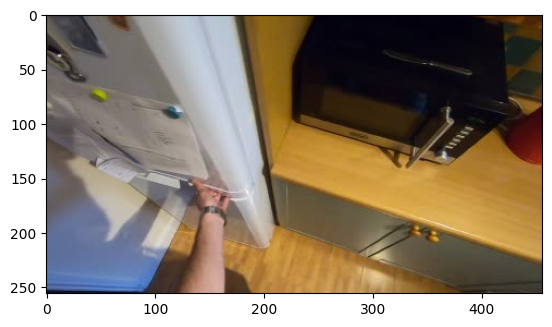

[array([[1.20250412e+02, 1.50484238e+02, 1.68913025e+02, 2.55080688e+02,
        8.70513678e-01],
       [1.08964096e+02, 1.45137360e+02, 3.79977203e+02, 2.52469315e+02,
        1.35440165e-02]], dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtype=float32), array([], shape=(0, 5), dtyp

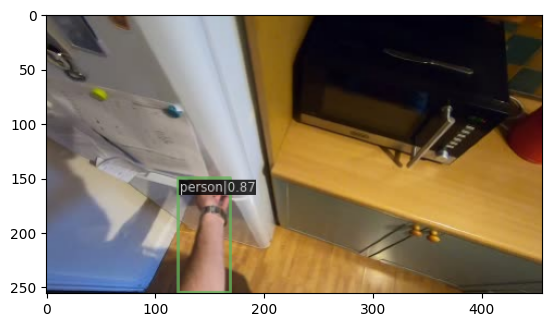

In [26]:
import PIL.Image as Image

IMG_IDX = 0
task_folder = "../assets/epic_kitchens"
hands_rgb = np.load(f"{task_folder}/rgb.npy")[START:END]
hands_depth = np.load(f"{task_folder}/depth.npy")[START:END]
testimg = Image.open(f"sample-image.jpg")
testimg = np.array(testimg)
intrinsics_matrices = np.load("../assets/epic_kitchens/intrinsics_matrices.npy", allow_pickle=True)
img_cv2 = cv2.cvtColor(hands_rgb[0], cv2.COLOR_BGR2RGB)# detect with mmdetection
# show image
plt.imshow(hands_rgb[0])
plt.show()
out, vis = mmdetectmodel.detect_and_visualize((hands_rgb[0] * 255).astype(np.uint8), score_threshold=.5)
plt.imshow(vis)
# out = out[0]


img_cv2 = cv2.cvtColor(testimg, cv2.COLOR_BGR2RGB)
# Detect humans in image
# det_out = detector(img_cv2)
# det_instances = det_out['instances']

# valid_idx = (det_instances.pred_classes==0) & (det_instances.scores > 0.1)
# pred_bboxes=det_instances.pred_boxes.tensor[valid_idx].cpu().numpy()
# pred_scores=det_instances.scores[valid_idx].cpu().numpy()

print(out)
bboxes = out[0]
# Each element corresponds to a class, and contains bounding boxes and scores for that class
# Bounding box format: [x1, y1, x2, y2, score]
for class_idx, class_result in enumerate(out):
    if len(class_result) > 0:
        print(f"Class {class_idx}:")
        for bbox in class_result:
            x1, y1, x2, y2, score = bbox
            print(f"  Bounding Box: {x1}, {y1}, {x2}, {y2}, Score: {score}")#plot image wih bounding boxes

masks = out[1]  # Segmentation masks
print(masks)

# # Visualize masks (or extract specific class masks)
for i, mask in enumerate(masks):
    # class_idx = np.argmax(bboxes[i])  # Get the predicted class for this mask
    # print(f"Class {class_idx} mask extracted.")
    
    # Show mask or save it
    if len(mask) > 0:
        mask_img = np.array(mask)[0].astype(np.uint8) * 255

        plt.imshow(mask_img, cmap='gray')
        plt.show()


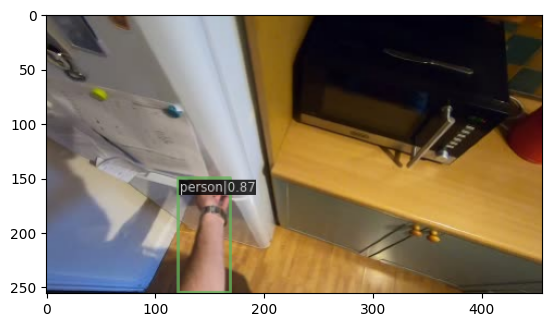

Time taken to detect hands:  2.1268179416656494
downsampling_factor=0.2578037579854329
downsampling_factor=0.22557832300662994
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


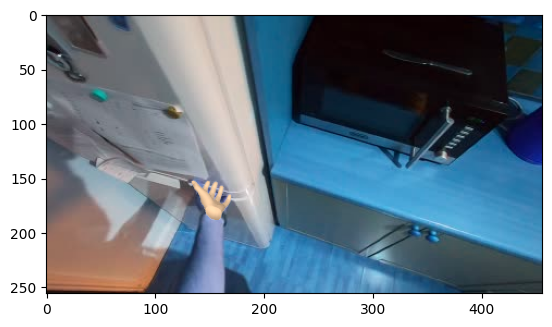

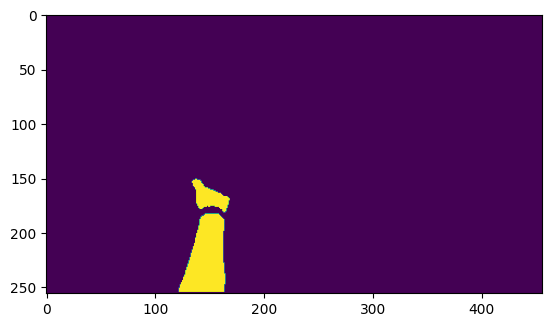

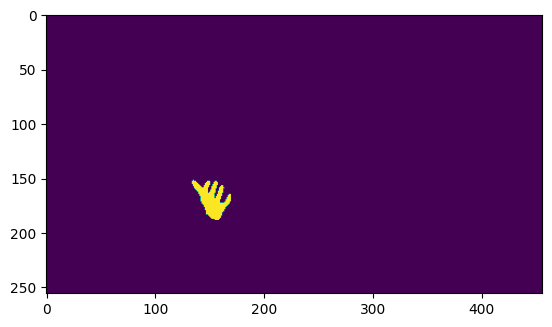

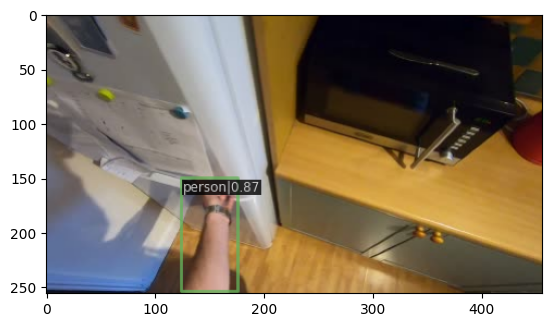

Time taken to detect hands:  2.484417676925659
downsampling_factor=0.32206249237060547
downsampling_factor=0.3327980041503906
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


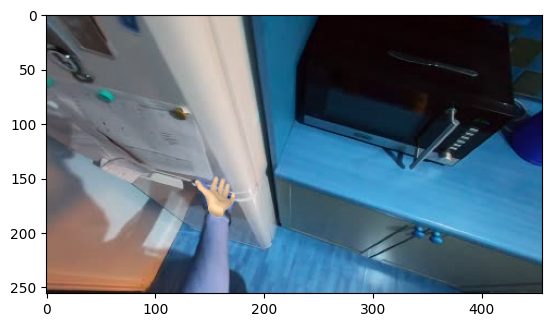

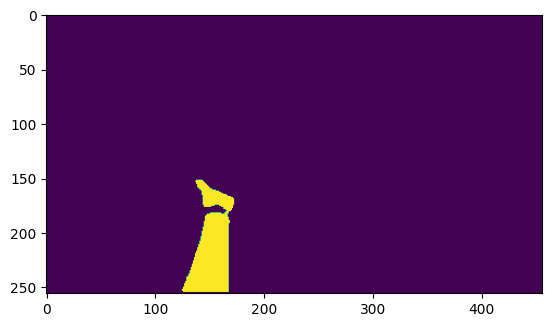

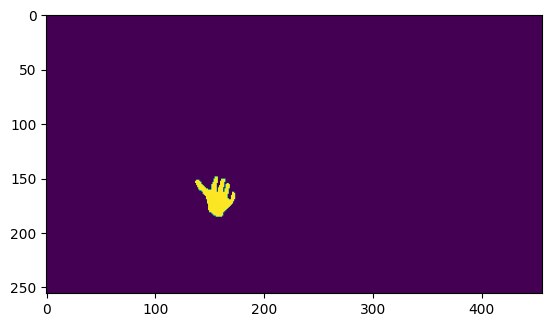

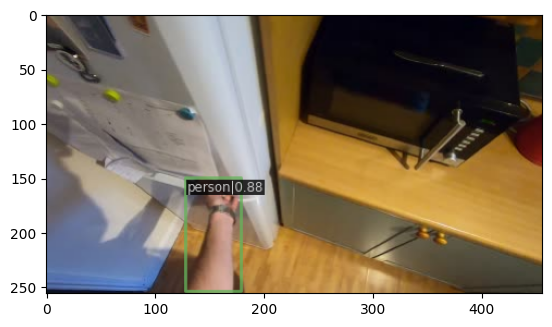

Time taken to detect hands:  2.2417221069335938
downsampling_factor=0.3309108416239421
downsampling_factor=0.3309108416239421
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


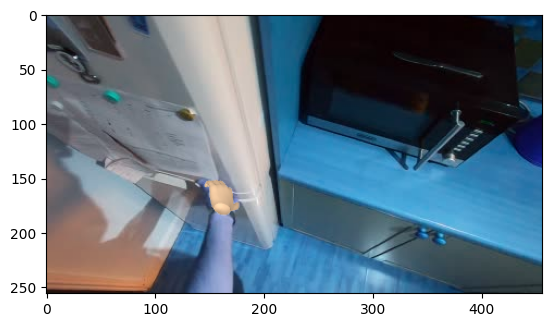

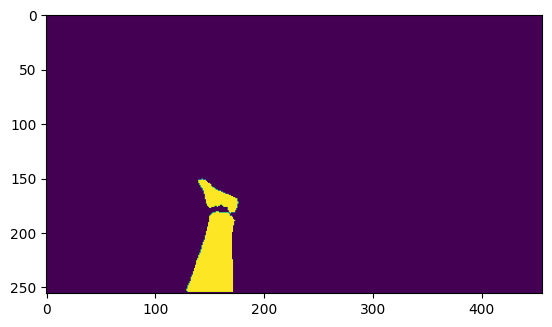

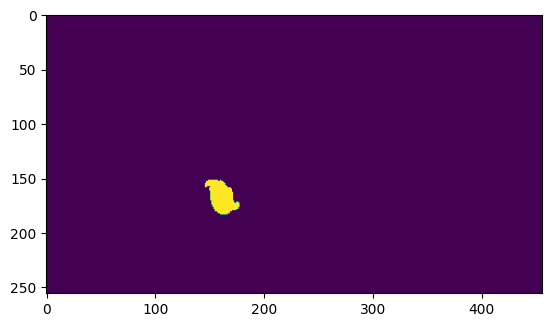

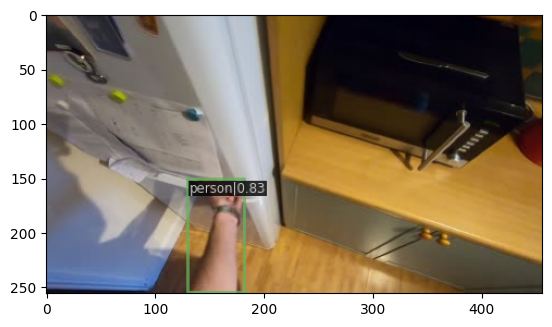

Time taken to detect hands:  2.01771879196167
downsampling_factor=0.31832679112752277
downsampling_factor=0.31832679112752277
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


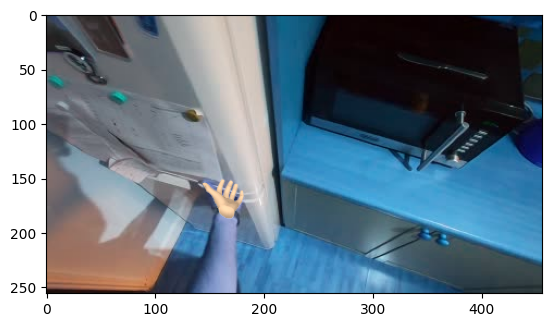

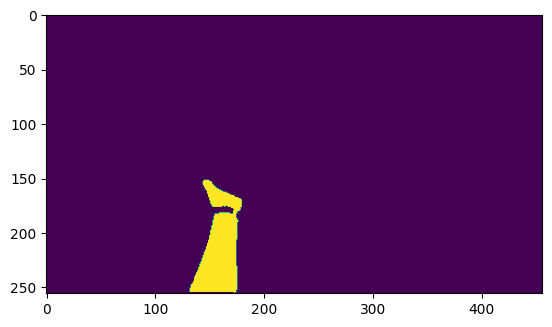

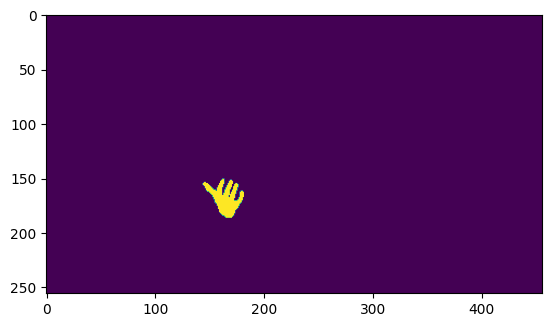

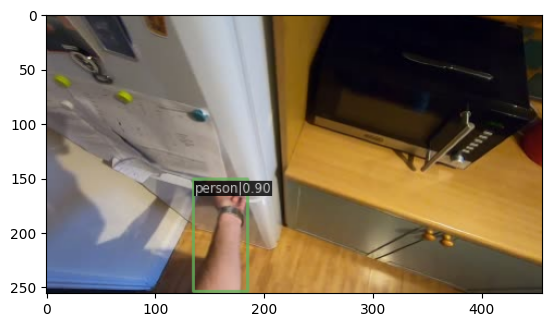

Time taken to detect hands:  2.3693320751190186
downsampling_factor=0.3406842549641927
downsampling_factor=0.33003805081049603
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


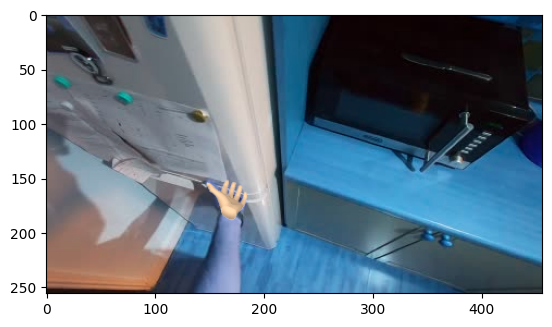

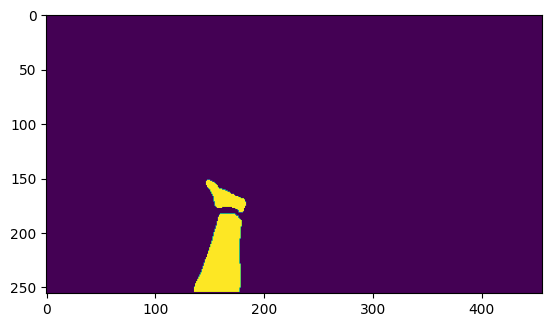

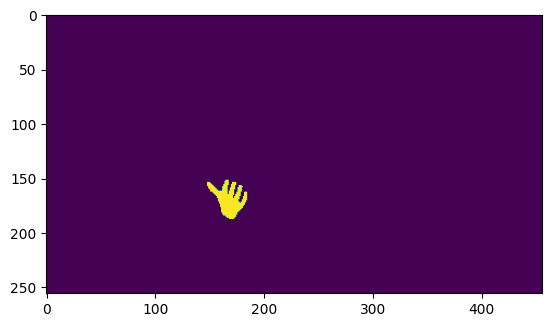

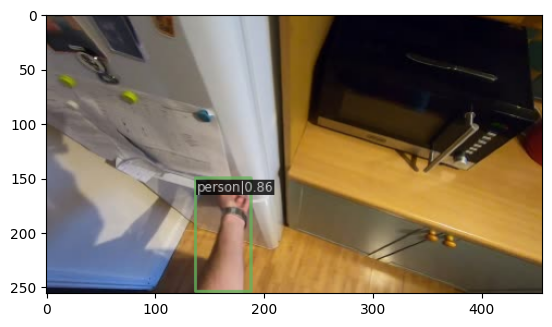

Time taken to detect hands:  2.4787113666534424
downsampling_factor=0.3402802149454753
downsampling_factor=0.32964642842610675
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


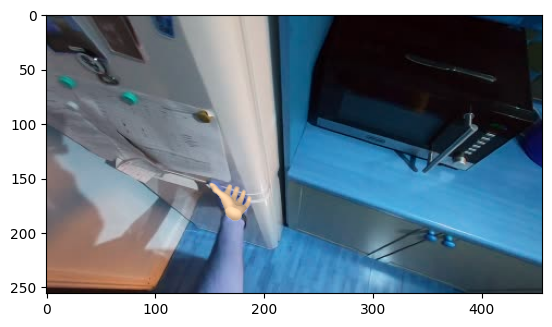

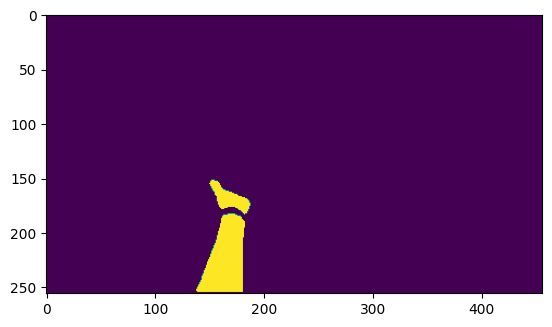

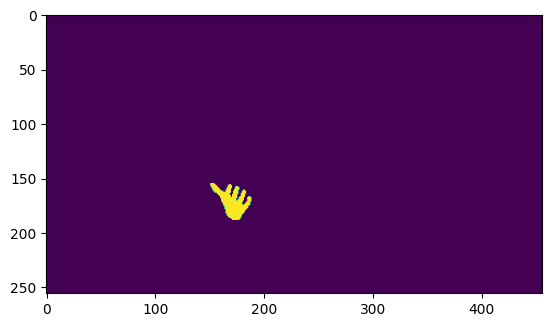

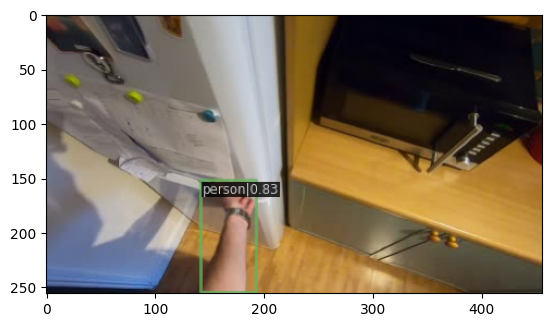

Time taken to detect hands:  1.8405203819274902
downsampling_factor=0.34892717997233075
downsampling_factor=0.34892717997233075
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


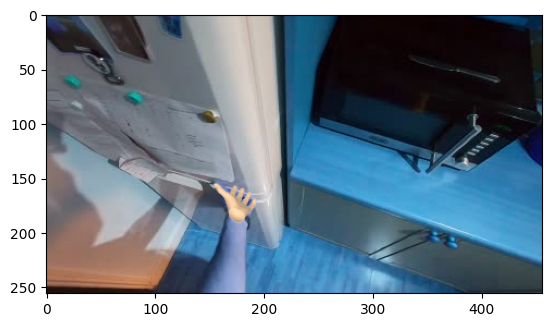

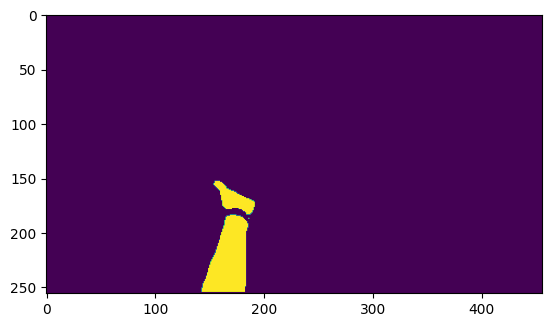

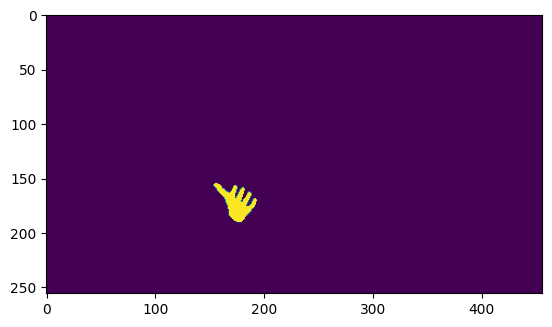

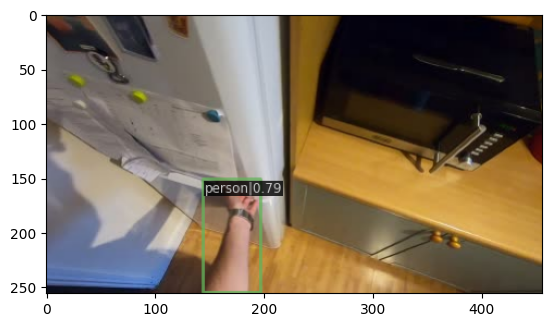

Time taken to detect hands:  2.453190803527832
downsampling_factor=0.3414371808369954
downsampling_factor=0.3414371808369954
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


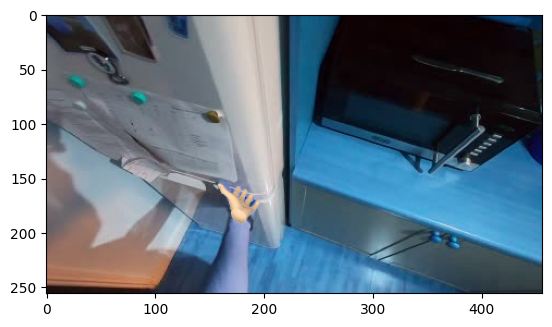

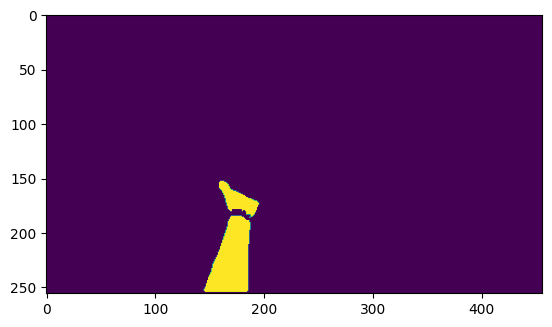

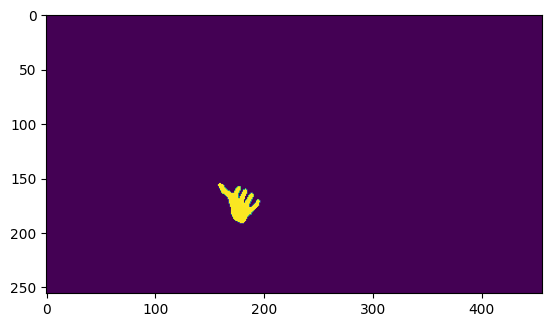

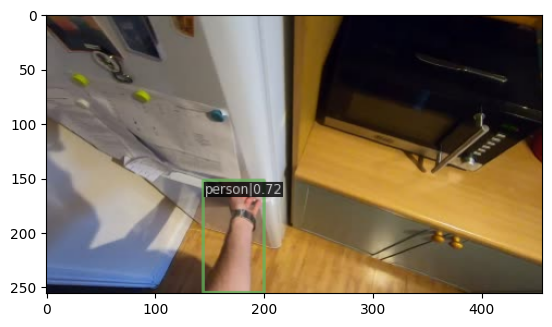

Time taken to detect hands:  2.1911799907684326
downsampling_factor=0.26366138458251953
downsampling_factor=0.31639353434244794
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


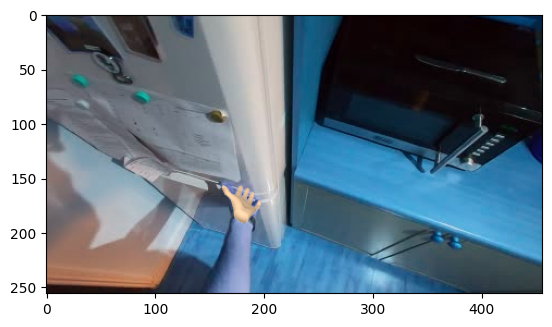

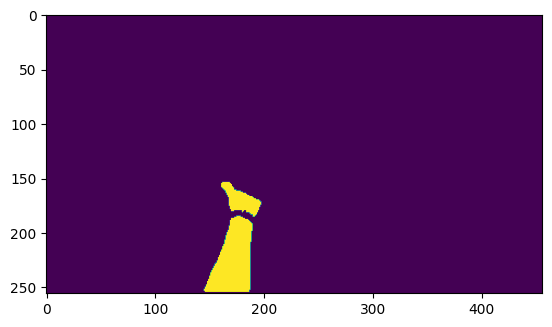

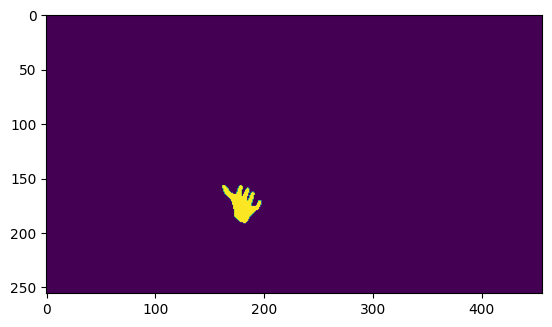

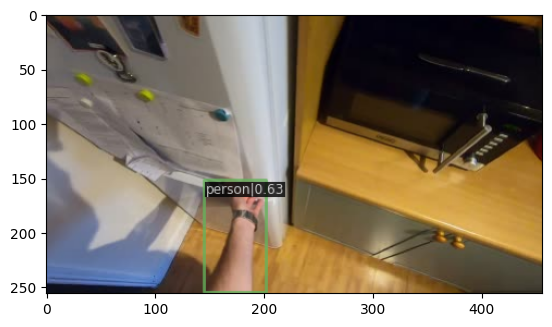

Time taken to detect hands:  2.0667436122894287
downsampling_factor=0.275173823038737
downsampling_factor=0.3280917803446452
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


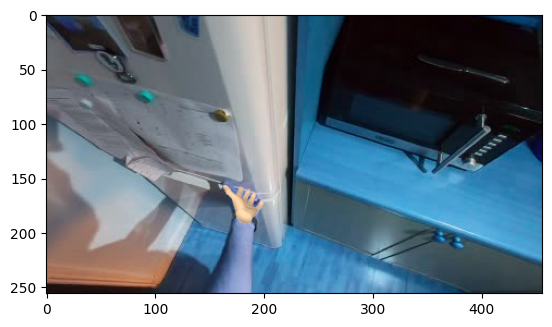

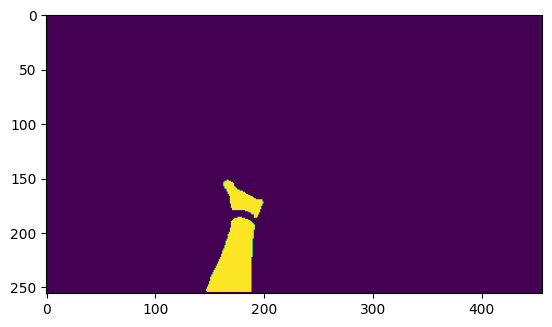

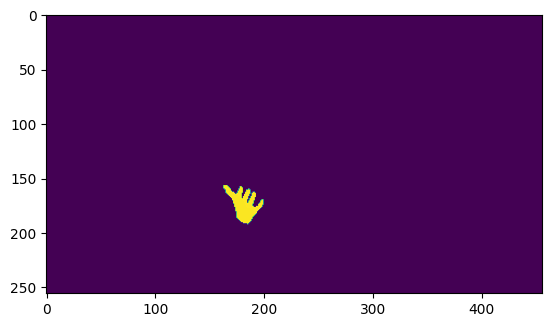

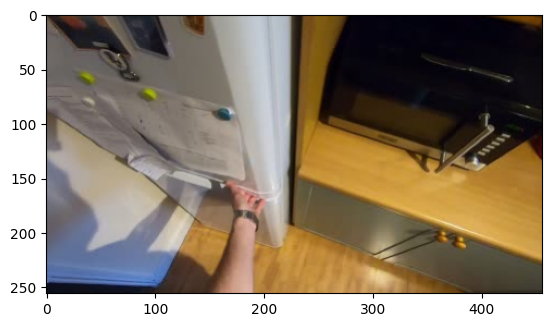

Time taken to detect hands:  0.12047314643859863
Error in image 10


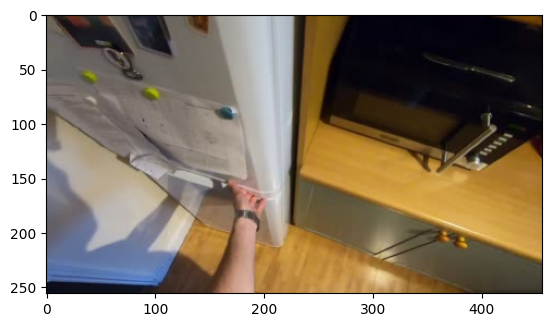

Time taken to detect hands:  0.11896181106567383
Error in image 11


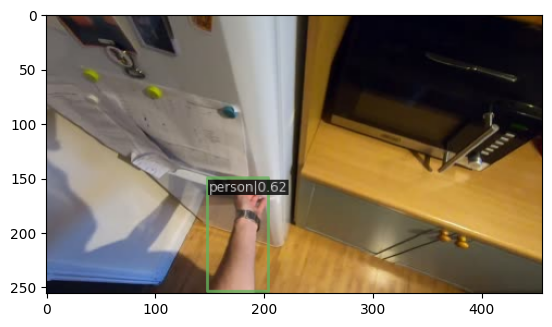

Time taken to detect hands:  2.179706573486328
downsampling_factor=0.26685365041097003
downsampling_factor=0.3202244242032369
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


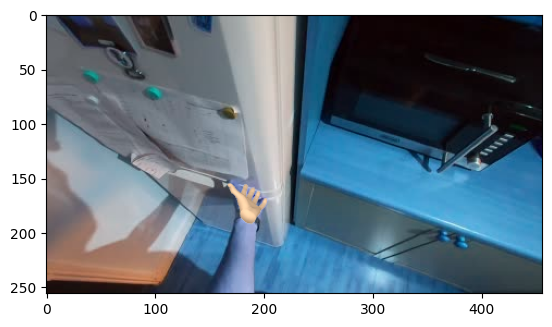

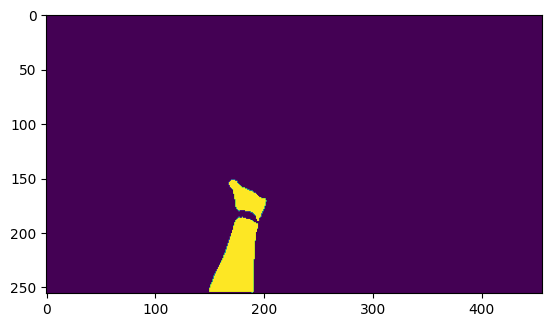

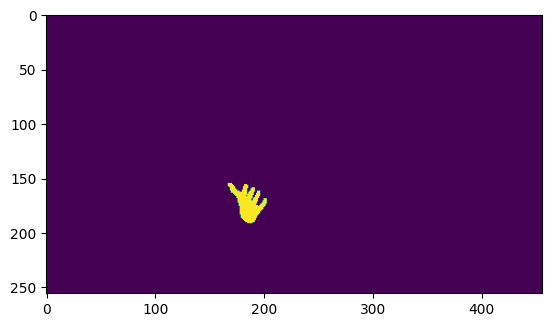

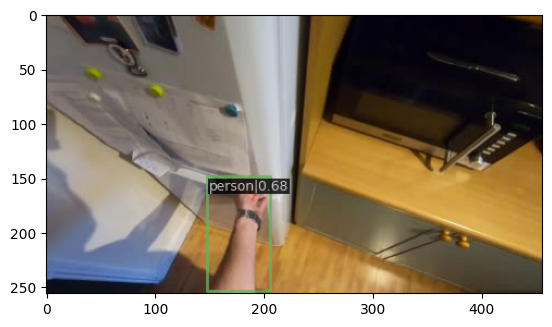

Time taken to detect hands:  1.9542503356933594
downsampling_factor=0.2583630879720052
downsampling_factor=0.30142370859781903
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


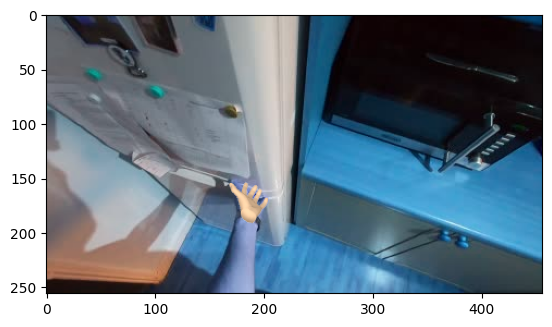

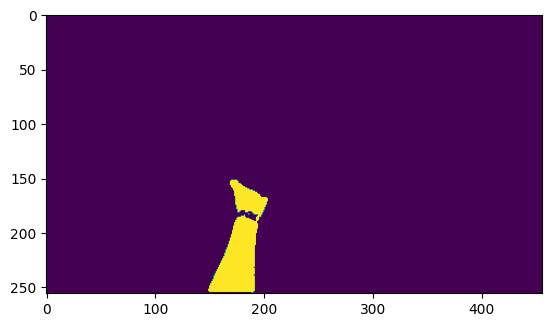

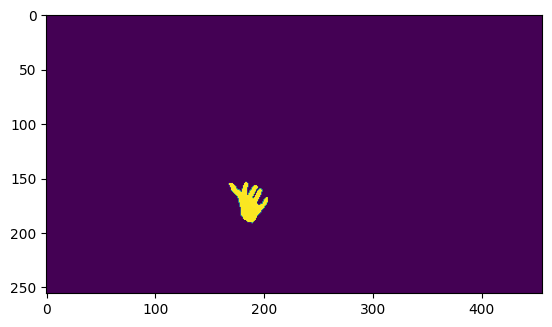

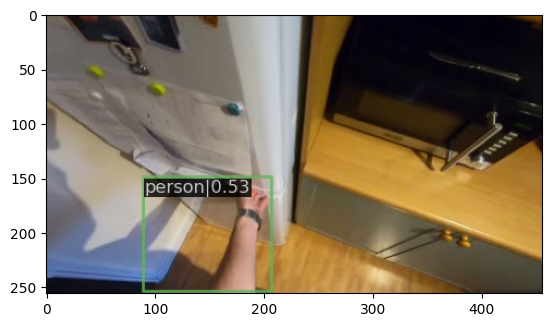

Time taken to detect hands:  2.257777214050293
downsampling_factor=0.20629286766052246
downsampling_factor=0.29123719533284503
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


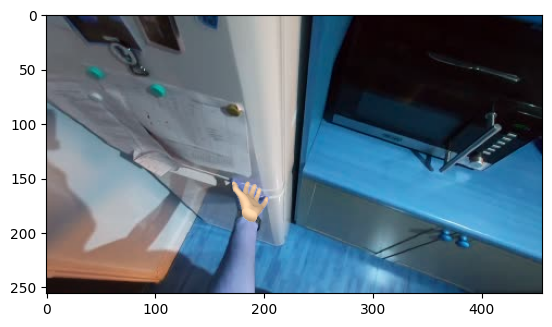

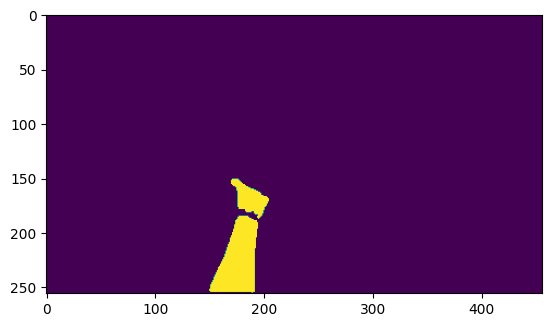

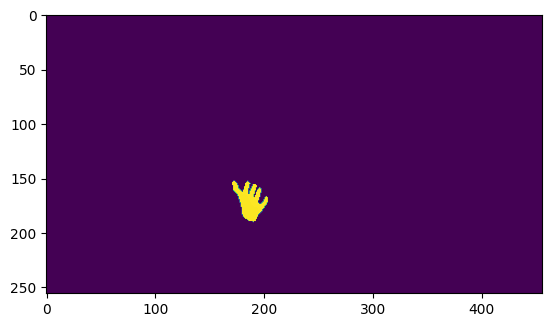

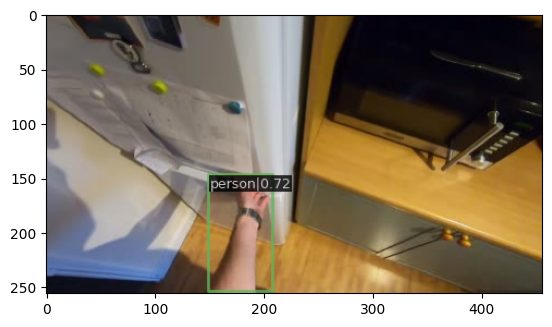

Time taken to detect hands:  2.2517783641815186
downsampling_factor=0.20978736877441406
downsampling_factor=0.29811890920003253
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


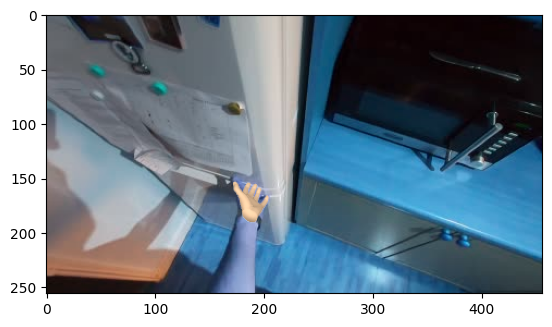

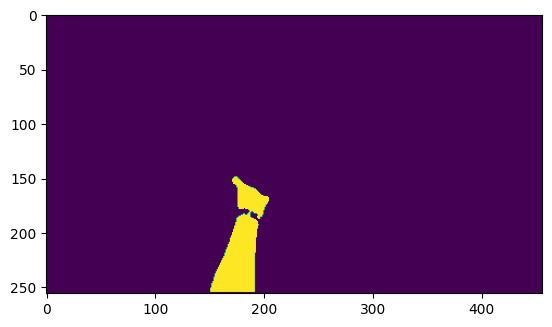

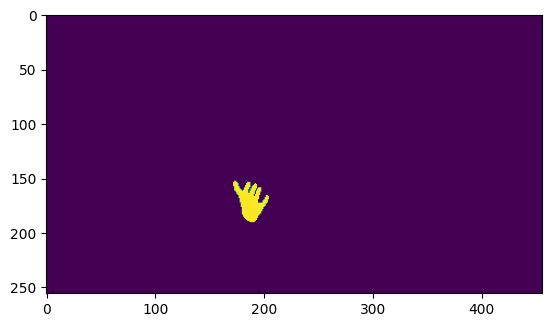

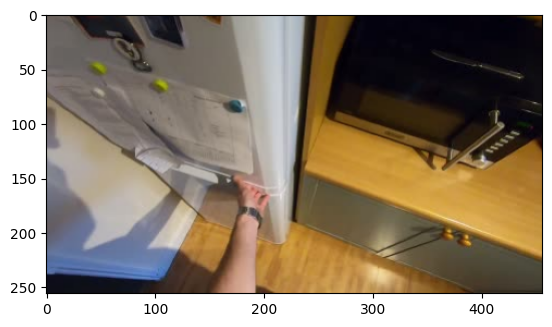

Time taken to detect hands:  0.1223440170288086
Error in image 16


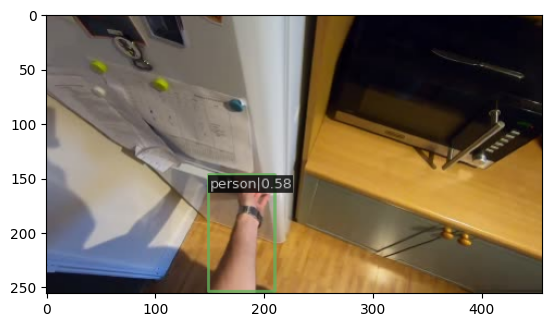

Time taken to detect hands:  2.0066092014312744
downsampling_factor=0.29763634999593097
downsampling_factor=0.29763634999593097
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


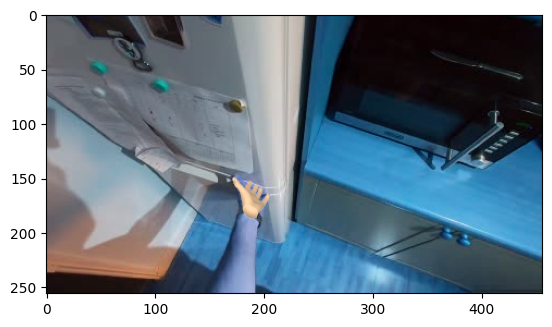

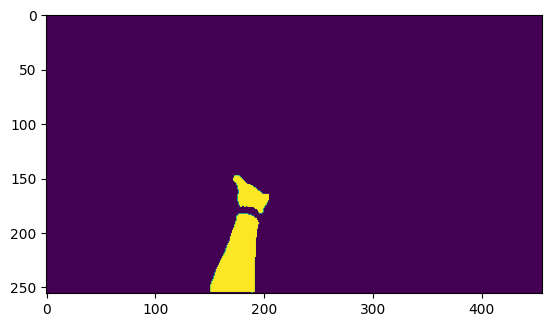

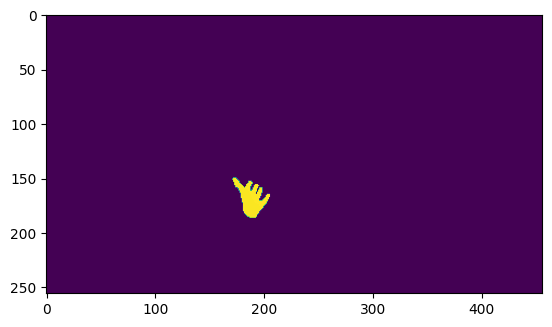

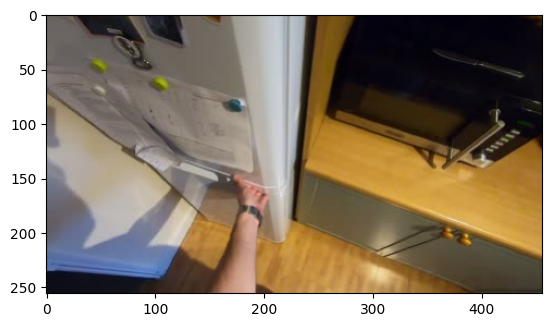

Time taken to detect hands:  0.1217045783996582
Error in image 18


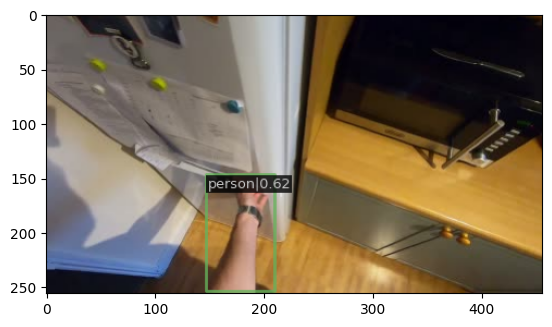

Time taken to detect hands:  2.2858121395111084
downsampling_factor=0.27578065792719525
downsampling_factor=0.28681198755900067
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


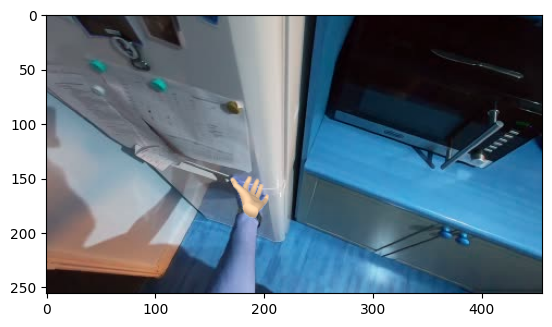

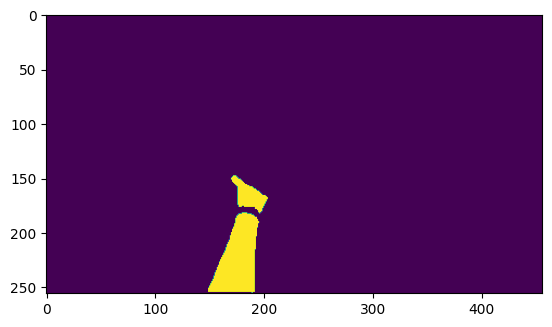

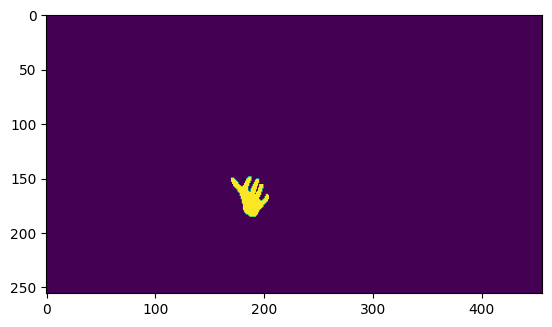

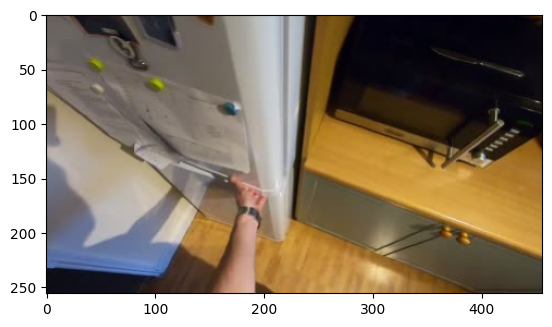

Time taken to detect hands:  0.11858534812927246
Error in image 20


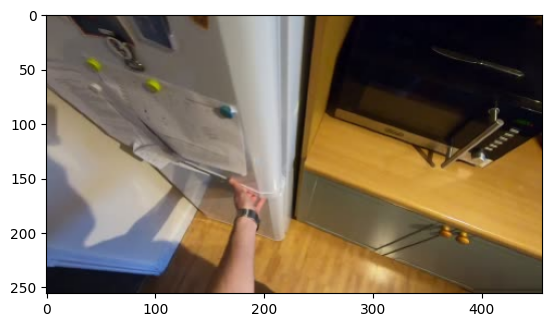

Time taken to detect hands:  0.12426638603210449
Error in image 21


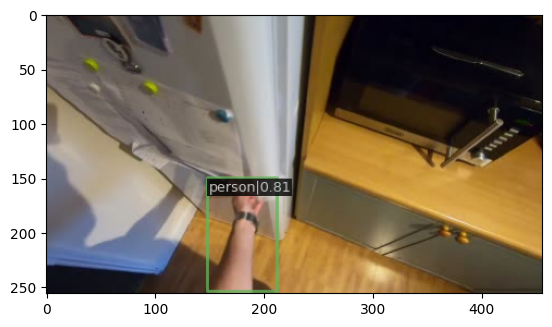

Time taken to detect hands:  2.011864185333252
downsampling_factor=0.2780890464782715
downsampling_factor=0.2780890464782715
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


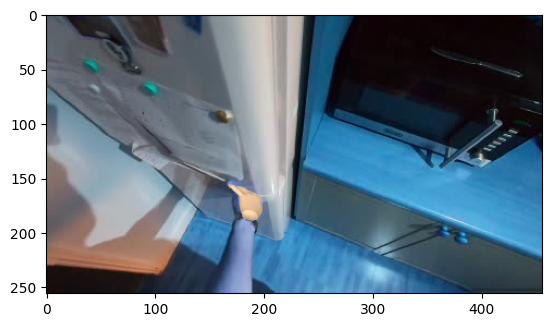

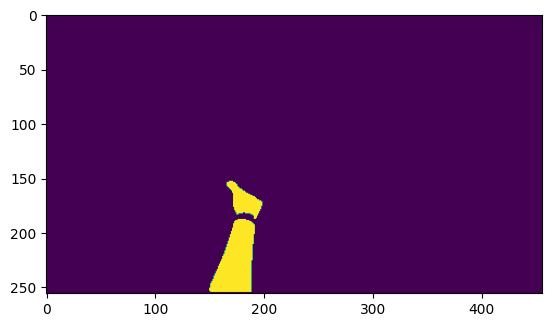

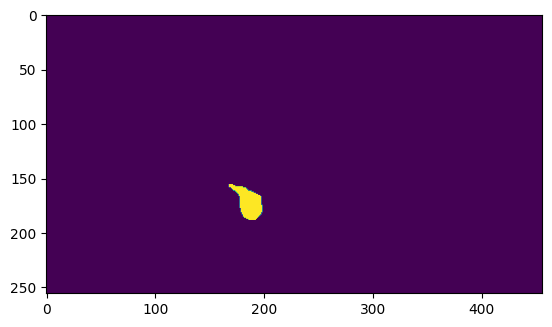

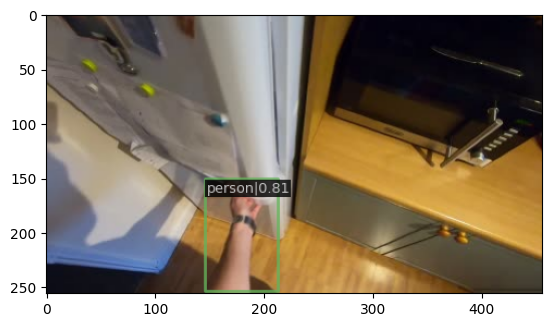

Time taken to detect hands:  2.007995128631592
downsampling_factor=0.22276200354099274
downsampling_factor=0.19093863169352213
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


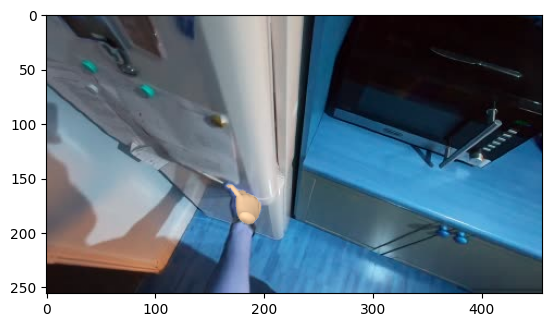

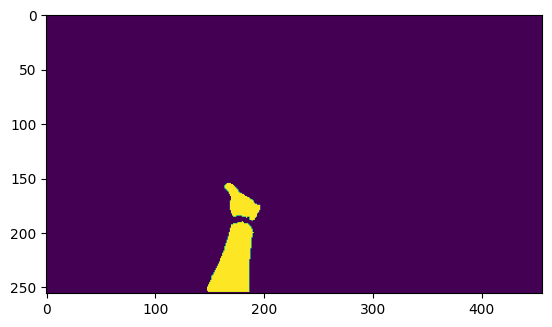

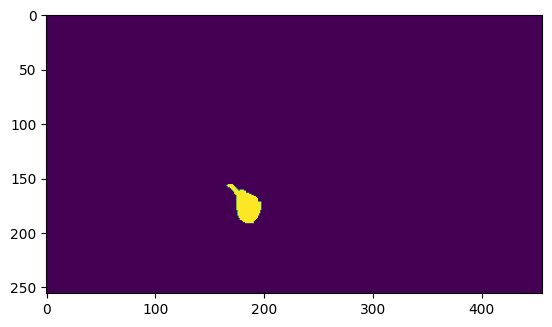

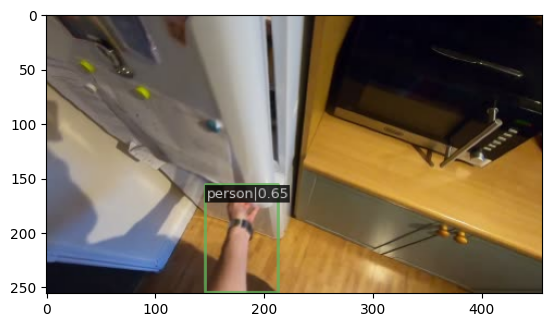

Time taken to detect hands:  1.9208753108978271
downsampling_factor=0.2744127909342448
downsampling_factor=0.20326884587605795
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


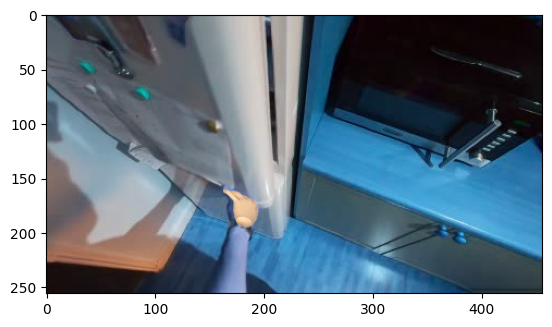

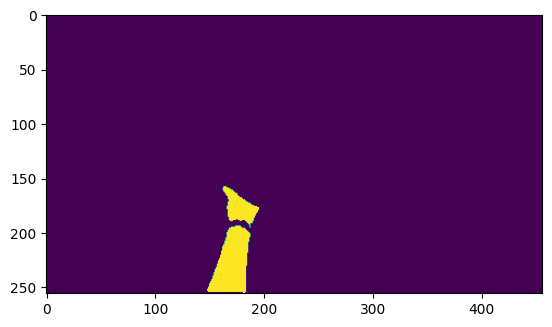

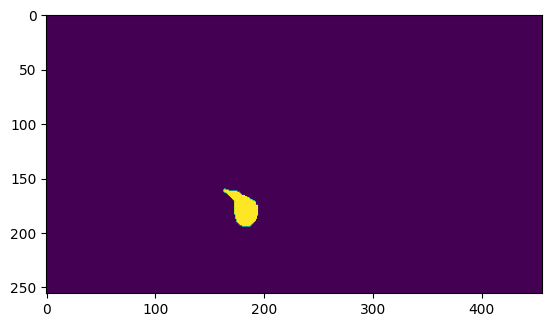

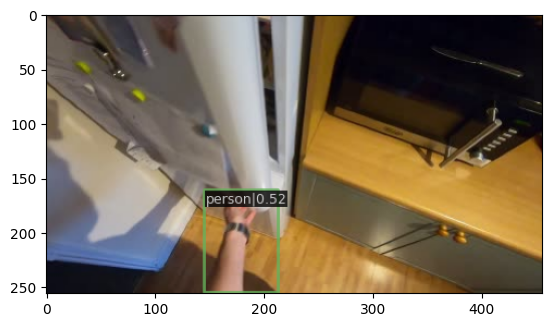

Time taken to detect hands:  2.502112627029419
downsampling_factor=0.20344853401184082
downsampling_factor=0.21798060834407806
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


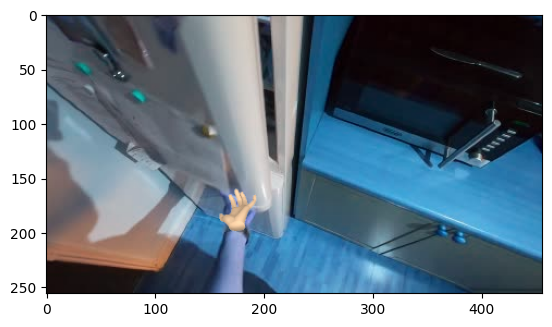

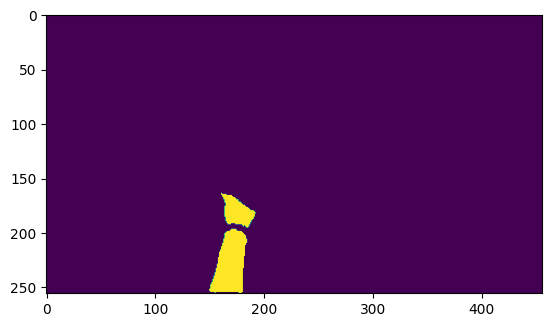

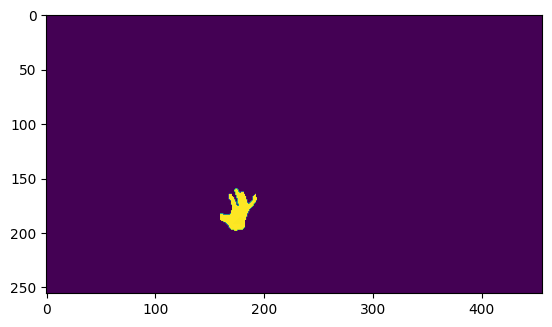

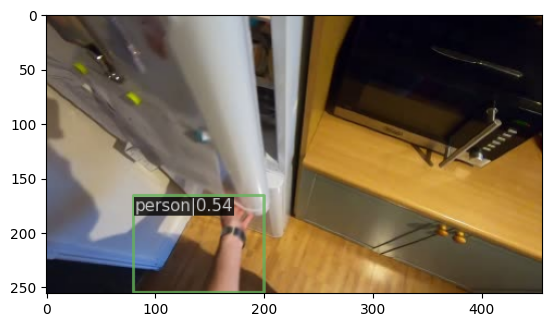

Time taken to detect hands:  2.5011849403381348
downsampling_factor=0.23352909088134766
downsampling_factor=0.23352909088134766
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


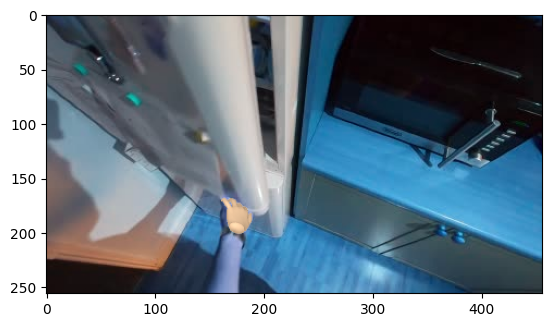

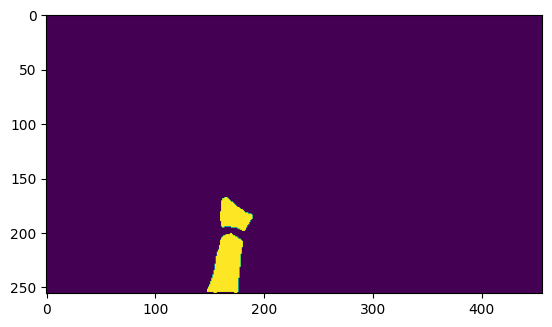

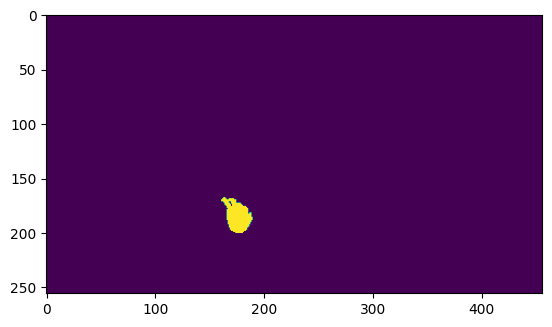

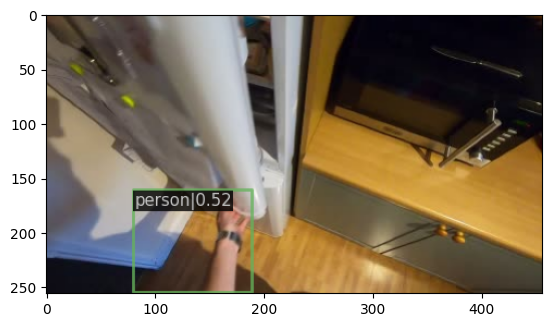

Time taken to detect hands:  2.5216257572174072
downsampling_factor=0.24738170206546783
downsampling_factor=0.25862646102905273
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


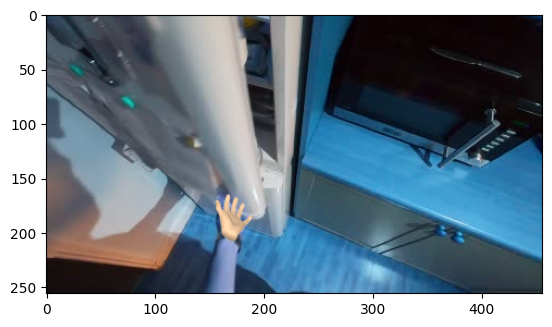

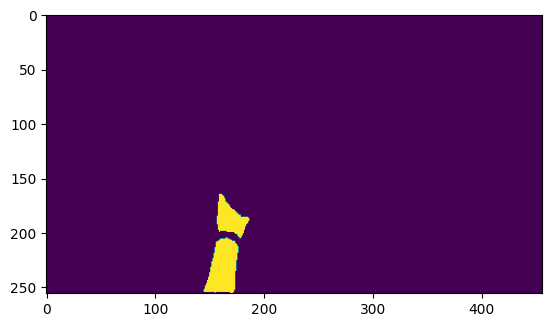

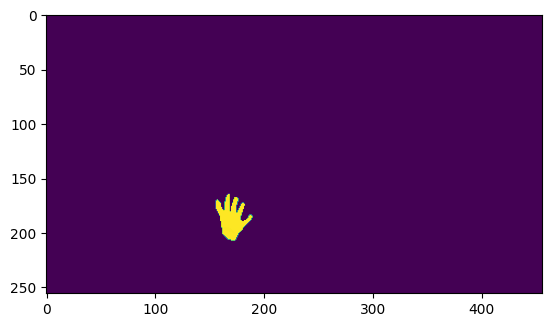

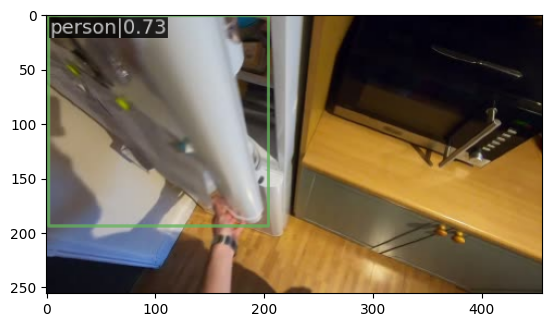

Time taken to detect hands:  2.522106170654297
downsampling_factor=0.2482435703277588
downsampling_factor=0.28961730003356934
Batch size: 2
[render_rgba_multiple] Focal length: 8906.25
[render_rgba_multiple] Camera center: [tensor(228.), tensor(128.)]


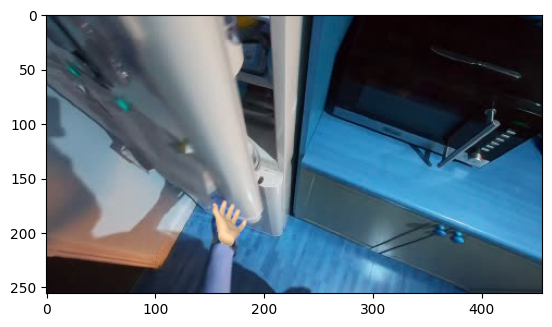

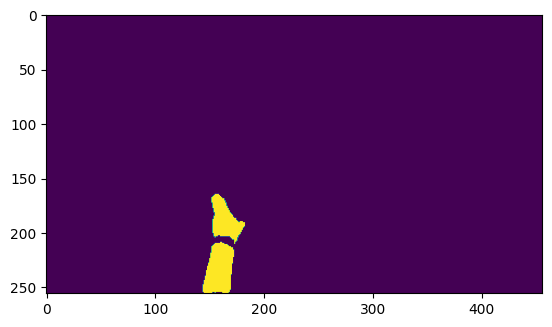

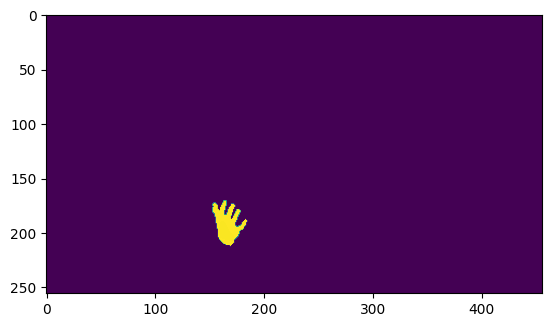

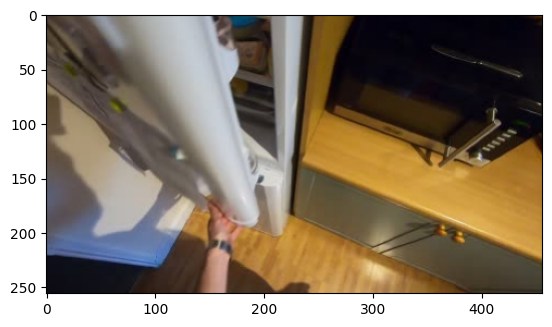

Time taken to detect hands:  0.12062716484069824
Error in image 29


: 

In [28]:
for k in range(30):
    try:
        IMG_IDX = k
        task_folder = "../assets/epic_kitchens"
        hands_rgb = np.load(f"{task_folder}/rgb.npy")[START:END]
        hands_depth = np.load(f"{task_folder}/depth.npy")[START:END]
        intrinsics_matrices = np.load("../assets/epic_kitchens/intrinsics_matrices.npy", allow_pickle=True)

        depth = hands_depth[IMG_IDX] / 1000
        rgb = hands_rgb[IMG_IDX]
        plt.imsave("rgb.png", rgb)
        depth = np.array(depth).astype(np.float32)
        rgb_im, rgb_hand_only, rend_depth_front_view, det_out, hamer_output, hand_mesh_params, all_mesh_params = get_hand_and_rendered_depth(rgb)
        depth_im = depth

        plt.imshow(rgb_im)
        plt.show()
        
        text_prompt = "a human arm and hand"
        image_pil = Image.fromarray((rgb * 255).astype(np.uint8))
        human_mask, boxes, phrases, logits = langsammodel.predict(image_pil, text_prompt)
        human_mask = np.array(human_mask)[0]
        plt.imshow(human_mask)
        plt.show()
        # human_mask = get_hand_mask_from_detectron(det_out)

        IM_HEIGHT, IM_WIDTH = rgb.shape[:2]

        all_meshes, all_cameras, all_vertices = all_mesh_params[0], all_mesh_params[1], all_mesh_params[2]
        hand_mesh, hand_camera_translation, mano_vertices = hand_mesh_params[0], hand_mesh_params[1], hand_mesh_params[2]
        rgb_hand_only = rgb_hand_only[:,:,:3]
        plt.imshow(rend_depth_front_view)
        plt.show()
    except:
        print(f"Error in image {IMG_IDX}")

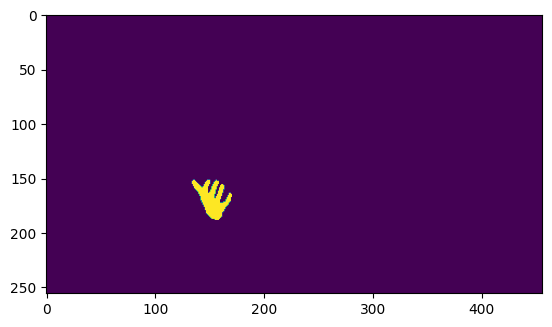

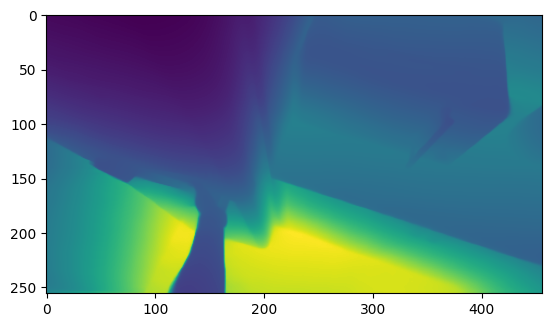

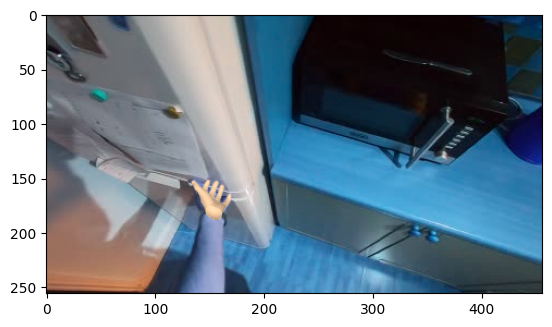

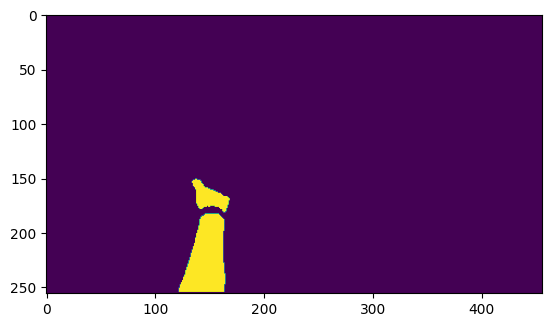

In [6]:
common_points_binary = np.zeros_like(rend_depth_front_view)
common_points_binary[rend_depth_front_view > 0] = 1 # binary mask of points in the rendered model depth
plt.imshow(common_points_binary)
plt.show()

depth_im_hand =  human_mask * depth_im # extract human hand from the live image
plt.imshow(depth_im)
plt.show()
plt.imshow(rgb_im)
plt.show()
depth_im_hand = common_points_binary * depth_im_hand # extract common points between rendered depth model and live image
plt.imshow(human_mask)
plt.show()


In [9]:
hand_point_cloud, hand_point_cloud_full, image_point_cloud, hand_pcd_as_o3d, live_image_pcd_as_o3d, T_mesh_to_live = get_hand_pcd_in_scene_from_rendered_model(rgb_im, 
                                                                                                                                               depth_im, 
                                                                                                                                               rend_depth_front_view, 
                                                                                                                                               rend_depth_front_view, 
                                                                                                                                               human_mask, 
                                                                                                                                               vizualize=False)

In [10]:
scaling_factor = 1
joint_meshes, joints_coords = get_joints_of_hand_mesh(copy.deepcopy(all_meshes[0]), copy.deepcopy(all_vertices[0]), copy.deepcopy(all_cameras[0]))
mesh_live_np, joints_live, hand_mesh_in_live_metric_space = mesh_and_joints_to_world_metric_space(copy.deepcopy(all_meshes[0]), 
                                                               copy.deepcopy(joints_coords), 
                                                               T_mesh_to_live, 
                                                               scaling_factor, 
                                                               live_image_pcd=live_image_pcd_as_o3d, 
                                                               vizualize=False)   

In [11]:
gripper_pcd = np.load('gripper_point_cloud_dense.npy')
gripper_pcd = gripper_pcd / 1000 # scale down by 1000
gripper_pcd_as_o3d = o3d.geometry.PointCloud()
gripper_pcd_as_o3d.points = o3d.utility.Vector3dVector(gripper_pcd)
hand_pcd_temp = hand_point_cloud_full.reshape(IM_HEIGHT, IM_WIDTH, 3)
gripper_aligned_to_hand_pcd_as_o3d = align_gripper_to_hand(hand_point_cloud, 
                                                            hand_pcd_as_o3d, 
                                                            gripper_pcd, 
                                                            gripper_pcd_as_o3d, 
                                                            vizualize=False)

In [12]:
key_fingers_points = np.array([joints_live[MANO_HAND_IDS["index_tip"]], #(joints_live[MANO_HAND_IDS["index_dip"]] + joints_live[MANO_HAND_IDS["index_tip"]] )/2, # this is done because the gripper does now have an unequal length of thumb and index as the human hand does
                                joints_live[MANO_HAND_IDS["index_dip"]],
                                joints_live[MANO_HAND_IDS["index_pip"]],
                                joints_live[MANO_HAND_IDS["thumb_tip"]], 
                                joints_live[MANO_HAND_IDS["thumb_dip"]], 
                                joints_live[MANO_HAND_IDS["thumb_pip"]], 
                                joints_live[MANO_HAND_IDS["wrist"]],
                                (joints_live[MANO_HAND_IDS["index_mcp"]] + joints_live[MANO_HAND_IDS["thumb_dip"]]) / 2])


key_fingers_points = key_fingers_points.reshape(-1, 3)
gripper_scaled_to_hand_pcd = copy.deepcopy(gripper_aligned_to_hand_pcd_as_o3d) # replace, so no scale applied
gripper_scaled_to_hand_pcd.paint_uniform_color([0, 0, 1])
bias_T  = np.eye(4)
bias_T[2, 3] = 0.01
gripper_scaled_to_hand_pcd, gripper_pose, distance_hand_fingers = align_gripper_with_hand_fingers(gripper_scaled_to_hand_pcd, 
                                                                np_to_o3d(mesh_live_np), 
                                                                key_fingers_points, 
                                                                gripper_aligned_to_hand_pcd_as_o3d,
                                                                gripper_pcd_as_o3d, 
                                                                use_only_thumb_keypoints=False,
                                                                use_only_index_keypoints=False,
                                                                rescale_gripper_to_hand_opening=False,
                                                                rescale_hand_to_gripper_opening=False,
                                                                bias_transformation=bias_T,
                                                                vizualize=False)

gripper_opening_percent = np.min([distance_hand_fingers / DISTANCE_BETWEEN_GRIPPERS_FINGERS, 1])
coord_frame = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=[0, 0, 0])
coord_frame.transform(gripper_pose)
o3d.visualization.draw_geometries([live_image_pcd_as_o3d, gripper_scaled_to_hand_pcd, coord_frame])

Distance between pt1 and pt2: 0.1031915041037886
Distance between gripper fingers: 0.08564327833671397


: 

In [ ]:
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
import copy
rgb_im = np.load("assets/rgb_test.npy")
depth_im = np.load("assets/depth_test.npy") / 1000

# depth_im to point cloud
point_cloud_camera = depth_to_point_cloud(depth_im, INTRINSICS_REAL_CAMERA[0, 0], INTRINSICS_REAL_CAMERA[1, 1], INTRINSICS_REAL_CAMERA[0, 2], INTRINSICS_REAL_CAMERA[1, 2]) # Camera intrinsics, depth at real scale, although the shape is not accurate
point_cloud_camera = point_cloud_camera.reshape(-1, 3)
# point_cloud_camera = point_cloud_camera[point_cloud_camera[:, 2] < 1.5] # remove points that are too far away
# point_cloud_camera = point_cloud_camera[point_cloud_camera[:, 2] > 0.1] # remove points that are too close
# to o3d
pcd_image = o3d.geometry.PointCloud()
pcd_image.points = o3d.utility.Vector3dVector(point_cloud_camera)
# set colours to rgb
pcd_image.colors = o3d.utility.Vector3dVector(rgb_im.reshape(-1, 3) / 255.0)



norman_actions = np.load("assets/unnorm_actions.npy")[:10]
print(norman_actions.shape)
plt.imshow(rgb_im)
plt.show()

gripper_poses_actions = []
# NEURAL NETWORK ACTIONS TO GRIPPER POSES
gripper_pcd = np.load('gripper_point_cloud_dense.npy')
gripper_pcd = gripper_pcd / 1000 # scale down by 1000
gripper_pcd_as_o3d = o3d.geometry.PointCloud()
gripper_pcd_as_o3d.points = o3d.utility.Vector3dVector(gripper_pcd)

def actions_to_gripper_poses(gripper_scaled_to_hand_pcd, 
                                    actions, 
                                    gripper_pcd_dense_mesh,  
                                    vizualize=False,
                                    bias_transformation=np.eye(4)):

    dense_pcd_kpts = {"index_front": 517980, "thumb_front": 248802, "wrist": 246448}
    gripper_fingers = np.array([gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["index_front"]], 
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["index_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["index_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["thumb_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["thumb_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["thumb_front"]],
                                gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["wrist"]]])

    kpt_o3d_sphere = []
    count = 0
    key_fingers_points_4pts = actions
    key_fingers_points = np.array(key_fingers_points_4pts)

    unit_vec_difference = (key_fingers_points[1] - key_fingers_points[0]) / np.linalg.norm(key_fingers_points[1] - key_fingers_points[0])
    distance_gripper_fingers = np.linalg.norm(gripper_fingers[0] - gripper_fingers[4])
    distance_key_fingers = np.linalg.norm(key_fingers_points[0] - key_fingers_points[1])
    difference_half = np.abs(distance_gripper_fingers - distance_key_fingers)/2
    pt1 = key_fingers_points[0] - unit_vec_difference * difference_half
    pt2 = key_fingers_points[1] + unit_vec_difference * difference_half
    middle_finger_point = key_fingers_points[0] + unit_vec_difference * distance_key_fingers/2
    unit_difference_between_middle_finger_point_and_key_fingers_last = (middle_finger_point - key_fingers_points[-1]) / np.linalg.norm(middle_finger_point - key_fingers_points[-1])

    distance_pt1_pt2 = np.linalg.norm(pt1 - pt2)
    print(f"Distance between pt1 and pt2: {distance_pt1_pt2}")
    print(f"Distance between gripper fingers: {distance_gripper_fingers}")
    key_fingers_points = np.array([pt1, pt2, key_fingers_points[-1]])
    # key_fingers_points = np.array([pt1, pt2])

    for kpt in key_fingers_points:
        sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.003)
        sphere.compute_vertex_normals()
        count += 1
        if count % 3 == 0:
            red, green, blue = 1, 0, 1
        elif count % 3 == 1:
            red, green, blue = 0,1,0
        else:
            red, green, blue = 1, 0.5, 0
        sphere.paint_uniform_color([red, green, blue])
        sphere.translate(kpt)
        kpt_o3d_sphere.append(sphere)
    
    # add middle finger point
    sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.003)
    sphere.compute_vertex_normals()
    sphere.paint_uniform_color([1, .5, .777])
    sphere.translate(middle_finger_point)
    kpt_o3d_sphere.append(sphere)

    # gripper_fingers_4pts = np.array([gripper_fingers[1], gripper_fingers[2], gripper_fingers[4], gripper_fingers[5]])
    gripper_fingers_4pts = np.array([gripper_fingers[0], gripper_fingers[4], gripper_fingers[-1]])
    # gripper_fingers_4pts = np.array([gripper_fingers[0], gripper_fingers[4]])


    gripper_fingers = np.array(gripper_fingers_4pts)
    gripper_fingers_o3d = []
    count = 0
    # Create vizualizer to sequentilaly add spheres to the gripper fingers
    for kpt in gripper_fingers:
        sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.003)
        sphere.compute_vertex_normals()
        count += 1
        if count % 3 == 0:
            red, green, blue = 1, 0, 1 # color: purple
        elif count % 3 == 1:
            red, green, blue = 0, 1, 0
        else:
            red, green, blue = 1, 0.5, 0
        sphere.paint_uniform_color([red, green, blue])
        sphere.translate(kpt)
        gripper_fingers_o3d.append(sphere)



    T = find_scaled_transformation(gripper_fingers[:2], key_fingers_points[:2], use_scale=False)
    # transform the gripper_fingers_o3d to the hand frame
    for sphere in gripper_fingers_o3d:
        sphere.transform(T)

    gripper_pcd_before_transform = copy.deepcopy(gripper_scaled_to_hand_pcd)
    gripper_scaled_to_hand_pcd.transform(T)
    # Assume R is the rotation matrix you've computed and t is the translation
    # Transform z2
    R = T[:3, :3]
    t = T[:3, 3]
    z1 = key_fingers_points[-1]
    x1 = key_fingers_points[0]
    y1 = key_fingers_points[1]
    z2 = gripper_fingers[-1]
    x2 = gripper_fingers[0]
    y2 = gripper_fingers[1]

    z2_transformed = R @ z2 + t
    # Compute rotation axis (using x2 and y2 after transformation)
    x2_transformed = R @ x2 + t
    y2_transformed = R @ y2 + t
    rotation_axis = y2_transformed - x2_transformed #np.cross(x2_transformed - y2_transformed, z2_transformed - y2_transformed)


    # find theta that bring z2 as closest as possible to z2 while keeping the rotation axis the same
    distance = 10e10
    rotation_theta = None
    for theta in np.linspace(0, 2 * np.pi, 1000):
        R_additional = rotation_matrix(rotation_axis, theta)
        z2_final = (z2_transformed -  (y2_transformed + x2_transformed) / 2) @ R_additional.T + (y2_transformed + x2_transformed) / 2
        distance_temp = np.linalg.norm(z2_final - z1)
        if distance_temp < distance:
            distance = distance_temp
            rotation_theta = theta

    # Apply rotation about the axis
    R_additional = rotation_matrix(rotation_axis, rotation_theta)
    z2_final = (z2_transformed -  (y2_transformed + x2_transformed) / 2) @ R_additional.T + (y2_transformed + x2_transformed) / 2

    T2 = np.eye(4)
    T2[:3, :3] = R_additional
    gripper_scaled_to_hand_pcd_points = np.asarray(gripper_scaled_to_hand_pcd.points)
    gripper_scaled_to_hand_pcd_points = (gripper_scaled_to_hand_pcd_points - (y2_transformed + x2_transformed) / 2) @ R_additional.T + (y2_transformed + x2_transformed) / 2
    gripper_scaled_to_hand_pcd.points = o3d.utility.Vector3dVector(gripper_scaled_to_hand_pcd_points)
    # gripper_scaled_to_hand_pcd.transform(T2)
    # gripper_aligned_to_hand_pcd_as_o3d.paint_uniform_color([.1, 1, 1])

    # z2_final = gripper_scaled_to_hand_pcd.points[dense_pcd_kpts["wrist"]]
    # add z2_final to sphere
    sphere = o3d.geometry.TriangleMesh.create_sphere(radius=.003)
    sphere.compute_vertex_normals()
    sphere.paint_uniform_color([0, 0, 0])
    sphere.translate(z2_final)
    kpt_o3d_sphere.append(sphere)

    if bias_transformation is None:
        bias_transformation = np.eye(4)
    # apply bias transformation in the gripper frame
    gripper_pose, gripper_zero_mean = get_gripper_transform_in_camera_frame(gripper_scaled_to_hand_pcd, 
                                                                            gripper_pcd_dense_mesh, 
                                                                            return_zero_meaned_gripper=True,
                                                                            vizualize=vizualize)
    gripper_pose = gripper_pose @ bias_transformation
    gripper_zero_mean.transform(gripper_pose)
    gripper_scaled_to_hand_pcd = copy.deepcopy(gripper_zero_mean)
        
    if vizualize:
            # o3d.visualization.draw_geometries([pcd_image, gripper_scaled_to_hand_pcd])
        line_o3d = o3d.geometry.LineSet()
        line_o3d.points = o3d.utility.Vector3dVector([key_fingers_points[0], key_fingers_points[0] + unit_vec_difference * 3])
        line_o3d.lines = o3d.utility.Vector2iVector([[0, 1]])

        line_o3d_2 = o3d.geometry.LineSet()
        line_o3d_2.points = o3d.utility.Vector3dVector([key_fingers_points[0], key_fingers_points[0] - unit_vec_difference * 3])
        line_o3d_2.lines = o3d.utility.Vector2iVector([[0, 1]])

        line_o3d_3 = o3d.geometry.LineSet()
        line_o3d_3.points = o3d.utility.Vector3dVector([middle_finger_point, key_fingers_points[1] + unit_difference_between_middle_finger_point_and_key_fingers_last * 3])
        line_o3d_3.lines = o3d.utility.Vector2iVector([[0, 1]])

        line_o3d_4 = o3d.geometry.LineSet()
        line_o3d_4.points = o3d.utility.Vector3dVector([middle_finger_point, key_fingers_points[1] - unit_difference_between_middle_finger_point_and_key_fingers_last * 3])
        line_o3d_4.lines = o3d.utility.Vector2iVector([[0, 1]])


        line_o3d_rotation_axis = o3d.geometry.LineSet()
        line_o3d_rotation_axis.points = o3d.utility.Vector3dVector([x2_transformed, x2_transformed + 10 * rotation_axis])
        line_o3d_rotation_axis.lines = o3d.utility.Vector2iVector([[0, 1]])

        line_o3d_rotation_axis_2 = o3d.geometry.LineSet()
        line_o3d_rotation_axis_2.points = o3d.utility.Vector3dVector([y2_transformed, y2_transformed - 10 * rotation_axis])
        line_o3d_rotation_axis_2.lines = o3d.utility.Vector2iVector([[0, 1]])

        gripper_frame_coord = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=[0, 0, 0])
        gripper_frame_coord.transform(gripper_pose)
        gripper_scaled_to_hand_pcd.paint_uniform_color([0.0,0.0,0.0])
        o3d.visualization.draw_geometries([gripper_scaled_to_hand_pcd, gripper_frame_coord] + gripper_fingers_o3d + kpt_o3d_sphere + [line_o3d, line_o3d_2, line_o3d_3, line_o3d_4, line_o3d_rotation_axis, line_o3d_rotation_axis_2])
        # o3d.visualization.draw_geometries([hand_pcd_as_o3d, gripper_scaled_to_hand_pcd] + gripper_fingers_o3d + kpt_o3d_sphere + [line_o3d_rotation_axis])

    
    return gripper_scaled_to_hand_pcd, gripper_pose, distance_key_fingers

gripper_pcds = []
for act in norman_actions:
    actions_test = np.array([act[0],
                                   act[1],
                                   (act[2] + act[3]) / 2,]) 
    
    gripper, gripper_pose, distance_hand_fingers= actions_to_gripper_poses(copy.deepcopy(gripper_pcd_as_o3d), actions_test, copy.deepcopy(gripper_pcd_as_o3d), vizualize=False)
    gripper_pcds.append(gripper)
    # coord_frame = o3d.geometry.TriangleMesh.create_coordinate_frame(size=.100, origin=[0, 0, 0])
    # coord_frame.transform(gripper_pose)
    # o3d.visualization.draw_geometries([pcd_image, gripper, coord_frame])

In [ ]:
for i in range(0, norman_actions.shape[0]):

    gripper_pcd_np = np.asarray(gripper_pcds[i].points)
    gripper_pcd_depth_im = point_cloud_to_depth_image(gripper_pcd_np,
                                                      INTRINSICS_REAL_CAMERA[0, 0],
                                                      INTRINSICS_REAL_CAMERA[1, 1],
                                                      INTRINSICS_REAL_CAMERA[0, 2],
                                                      INTRINSICS_REAL_CAMERA[1, 2],
                                                      width=IM_WIDTH,
                                                      height=IM_HEIGHT) 
    gripper_pcd_depth_im[gripper_pcd_depth_im > 0] = 1
    im = .5 * rgb_im + .5 * gripper_pcd_depth_im
    plt.imshow(im)
    plt.show()
    input()